In [1]:

import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
import math
import os
import itertools
import warnings
import glob
import sys
import networkx as nx
from pyvis import network as net
import plotly.graph_objects as go
import plotly.express as px

# Let's focus on the current colleagues in the departments (the list that Roland sent), and then we check all their papers (regardless of what affiliation is written on the papers).  For example, if the head of the department had a paper in 1996 at another university, then we also take this paper into consideration. 

## Calculate the metrics for all these papers. 

In [2]:

mtid="10012522,10041405,10011729,10042381,10011669,10042216,10070052,10042206,10004672,10043154,10063931,10013078,10042246,10046850,10000951,10077397,10085337,10057699,10028223,10010616,10004964,10041238,10003438,10022680,10010572,10011985,10078413,10002331,10041425,10068236,10041406,10003450,10027650,10001247,10000182,10003616,10049654,10028073,10000168,10078429,10050580,10025398,10041428,10019177,10042217,10083060,10011896,10002205,10031107,10060734,10031961,10007872,10017841,10012191,10042205,10032461,10046700,10009038,10011812,10011720,10048502,10028363,10006497,10000799,10052318,10051932,10011727,10042404,10041699,10002058,10000486,10001060,10045285,10041426,10066588,10034810,10000476,10012374,10035521,10084870,10028381,10011667,10065149,10009305,10003409,10065152,10000407,10011665,10011721,10012192,10041399,10001238,10000434,10082160,10041404,10044622,10010416,10023210,10027379,10001251,10000937,10041403,10070736,10011668,10029438,10066279,10058012,10010951,10070026,10019822,10000734,10042772,10058310,10011734,10019824,10019824,10042219,10015273,10009327"                   
for year in tqdm(range(1990, 2023)):
    page = 1
    while True:
        fName = f"./1_1/mtmtpubs-{year}-{page}.json"
        enYear = year
        stYear = 1900 if year <= 1990 else year
        os.system(f'wget -O {fName} "https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=authors.mtid;in;{mtid}&cond=publishedYear;range;{stYear}%2C{enYear}&sort=publishedYear,desc&sort=firstAuthor,asc&page={page}&size=1000&fields=citations,pubStats&labelLang=hun&cite_type=2"')
        with open(fName, "r") as f:
            try:
                dta = json.load(f)
                if not dta["paging"]["last"]:
                    page += 1
                else:
                    break
            except:
                print("Error, retrying")
                pass



  0%|                                                    | 0/33 [00:00<?, ?it/s]--2023-01-30 16:22:52--  https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=authors.mtid;in;10012522,10041405,10011729,10042381,10011669,,10042216,10070052,10042206,10004672,10043154,10063931,10013078,10042246,10046850,10000951,10077397,10085337,10057699,10028223,10010616,10004964,10041238,10003438,10022680,10010572,10011985,10078413,10002331,10041425,10068236,10041406,10003450,10027650,10001247,10000182,10003616,10049654,10028073,10000168,10078429,10050580,10025398,10041428,10019177,10042217,10083060,10011896,10002205,10031107,10060734,10031961,10007872,10017841,10012191,10042205,10032461,10046700,10009038,10011812,10011720,10048502,10028363,10006497,10000799,10052318,10051932,10011727,10042404,10041699,10002058,10000486,10001060,10045285,10041426,10066588,10034810,10000476,10012374,10035521,10084870,10028381,10011667,10065149,10009305,10003409,10065152,10000407,10011665,10011

In [3]:
content = []
for fn in glob.glob("./1_1/*.json"):
    pubs = json.load(open(fn)) 
    content += pubs["content"]

In [4]:
tszmap = {}
#ALGEBRA
#ANALYSIS
#Differential Equations
#Geometry
#Stochastics
tszmap['Algebra Tanszék (BME / TTK / MI)'] = "ALGEBRA"
tszmap['Analízis Tanszék (BME / TTK / MI)'] = "ANALYSIS"
tszmap['Differenciálegyenletek Tanszék (BME / TTK / MI)'] = "Differential_Equations"
tszmap['Geometria Tanszék (BME / TTK / MI)'] = "Geometry"
tszmap['Sztochasztika Tanszék (BME / TTK / MI)'] = "Stochastics"

inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [tszmap[s] for s in a["label"].split("] ")[-1].split("; ") if s in tszmap]
tanszekek = np.unique(inst)
print(tanszekek)

# Ezek pedig a figyelembe nem vett VIK-es affiliációk
inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [s for s in a["label"].split("] ")[-1].split("; ") if "BME / TTK / MI)" in s and s not in tszmap]
nemtanszek = np.unique(inst)
print(nemtanszek)

['ALGEBRA' 'ANALYSIS' 'Differential_Equations' 'Geometry' 'Stochastics']
[]


In [5]:
ifdf = pd.read_csv('./pubgraph/ifdf_v8_2021.csv')
ifdf.loc[ifdf["if"].isnull(), "if"] = 0.0
maxIFYear = ifdf.year.max()
ifdf_e = ifdf.copy().set_index(["year", "eissn"]).sort_index()
ifdf_p = ifdf.copy().set_index(["year", "pissn"]).sort_index()

def getif(pub):
    if "journal" not in pub:
        return 0.0, 1.0
    year = min(pub["publishedYear"], maxIFYear)
    if "pIssn" in pub["journal"]:
        issn = pub["journal"]["pIssn"]
        if (year,issn) in ifdf_p.index:
            ifval = ifdf_p.loc[(year,issn),"if"]
            catif = ifdf_p.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    if "eIssn" in pub["journal"]:
        issn = pub["journal"]["eIssn"]
        if (year,issn) in ifdf_e.index:
            ifval = ifdf_e.loc[(year,issn),"if"]
            catif = ifdf_e.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    return 0.0, 1.0

# a függvény visszaadja a folyóirat rangját (D1, Q1, Q2, ...)
def getrating(pub):
    if "ratings" not in pub:
        return ""
    for r in pub["ratings"]:
        if r["otype"] == "SjrRating" and "ranking" in r:
            return r["ranking"]
    return ""


In [6]:
for pub in content:
    pub["mtmt_title"] = ""
    if "error" in pub and pub["error"] != "VALIDATION_ERROR":
        pub["mtmt_cat"] = "skip - error"
    elif not pub["published"]:
        pub["mtmt_cat"] = "skip - nem published"
    elif "category" not in pub or pub["category"]["label"] != "Tudományos":
        pub["mtmt_cat"] = "skip - nem tudományos"        
    elif pub["otype"] == "JournalArticle" and "journal" in pub:
        if pub["fullPublication"] and "reviewType" in pub["journal"] and pub["journal"]["reviewType"] == "REVIEWED" and "subType" in pub and (pub["subType"]["name"] == "Szakcikk" or pub["subType"]["name"] == "Összefoglaló cikk" or pub["subType"]["name"] == "Konferenciaközlemény" or pub["subType"]["name"] == "Rövid közlemény" or pub["subType"]["name"] == "Sokszerzős vagy csoportos szerzőségű szakcikk"):
            pub["mtmt_cat"] = "journal"
        else:
            pub["mtmt_cat"] = "skip - nem lektorált folyóirat vagy nem értékelhető típus"
    elif pub["fullPublication"] and ((pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and pub["subType"]["label"] == "Konferenciaközlemény (Könyvrészlet)") or pub["type"]["label"] == "Egyéb konferenciaközlemény"):
        pub["mtmt_cat"] = "conference"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["book"]["title"]
    elif pub["type"]["label"] == "Könyv" or (pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and (pub["subType"]["label"] == "Könyvfejezet (Könyvrészlet)" or pub["subType"]["label"] == "Szaktanulmány (Könyvrészlet)")):
        pub["mtmt_cat"] = "book"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["title"]
    elif pub["type"]["label"] == "Oltalmi formák":
        pub["mtmt_cat"] = "patent"
    elif not pub["fullPublication"]:
        pub["mtmt_cat"] = "skip - nem full publication"        
    elif pub["type"]["label"] == "Egyéb" or pub["type"]["label"] == "Disszertáció":
        pub["mtmt_cat"] = "skip - other"
    else:
        pub["mtmt_cat"] = "skip - uncategorized"
    
    # Oldalszám - a túl rövid publikációkat az MTA MTO nem veszi figyelembe
    plength = 0
    if 'pageLength' in pub:
        plength = pub["pageLength"]
    elif 'firstPage' in pub and 'lastPage' in pub and pub["lastPage"].isnumeric() and pub["firstPage"].isnumeric():
        plength = int(pub["lastPage"]) - int(pub["firstPage"]) + 1
    
    # Q pontszám kiszámolása a publikációra, az MTA MTO szabályai szerint
    pub["mtmt_q"] = 0    
    pub["mtmt_norm_q"] = 0    
    pub["mtmt_if"] = 0    
    pub["mtmt_norm_if"] = 0    
    nrm = 1.0
    if pub["mtmt_cat"] == "journal":
        ifct, nrm = getif(pub)        
        pub["mtmt_if"] = ifct
        pub["mtmt_norm_if"] = ifct / nrm
        if ifct > 0:
            pub["mtmt_q"] = max(0.6, ifct)
            pub["mtmt_norm_q"] = max(0.6, pub["mtmt_norm_if"])
        else:
            if pub["foreignEdition"]:
                pub["mtmt_q"] = 0.4
            else:
                pub["mtmt_q"] = 0.3
            pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "conference" and plength >= 4:
        if pub["foreignLanguage"]:
            pub["mtmt_q"] = 0.2
        else:
            pub["mtmt_q"] = 0.1
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "book" and plength >= 10:
        if plength >= 100:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 2
            else:
                pub["mtmt_q"] = 1
        else:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 0.2 * np.floor(plength/10)
            else:
                pub["mtmt_q"] = 0.1 * np.floor(plength/10)            
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    
    # I pontszám kiszámolása, összesen és évenként is
    pub["mtmt_i"] = pub["independentCitationCount"] # teljes eddigi I pontszám
    pub["mtmt_i_year"] = {}
    
    if "pubStats" in pub and "years" in pub["pubStats"]:
        for yr in pub["pubStats"]["years"]:
            pub["mtmt_i_year"][yr["year"]] = yr["independentCitationCount"]
    
    # Tanszék arányok a publikációban
    tszpart = {'ALGEBRA':0, 'ANALYSIS':0, 'Differential_Equations':0, 'Stochastics':0, 'Geometry':0} 
    authors = 0
    if "authorships" in pub:
        for auth in pub["authorships"]:
            if auth["authorTyped"]: # csak szerzőket veszünk figyelembe, szerkesztőket nem!
                authors += 1
                for tsz in tszmap:
                    if tsz in auth["label"]:
                        tszpart[tszmap[tsz]] += 1
                        break
    pub["mtmt_authors"] = authors  # a cikk szerzőinek száma
    if authors > 0:
        for v in tszpart:
            tszpart[v] /= authors
    pub["mtmt_tsz"] = tszpart # a cikkben részt vevő tanszékek aránya
    pub["mtmt_rating"] = getrating(pub)


In [7]:
pubyearly = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=map(list, zip(*itertools.product(tanszekek, range(2003, 2023)))))

dct = pubyearly.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        for tsz in tanszekek:
            if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023 and ("publicationPending" not in pub or not pub["publicationPending"]):
                if pub["mtmt_tsz"][tsz] > 0:
                    dct["Q pontszám"][(tsz,year)] += pub["mtmt_q"] * pub["mtmt_tsz"][tsz]
                    dct["Normalizált Q"][(tsz,year)] += pub["mtmt_norm_q"] * pub["mtmt_tsz"][tsz]
                    if pub["mtmt_if"] > 0:
                        dct["IF"][(tsz,year)] += pub["mtmt_if"] * pub["mtmt_tsz"][tsz]         
                        dct["Normalizált IF"][(tsz,year)] += pub["mtmt_norm_if"] * pub["mtmt_tsz"][tsz]         
                    if pub["mtmt_cat"] == "journal":
                        dct["Lektorált folyóiratok száma"][(tsz,year)] += 1                
                        if pub["mtmt_if"] > 0:
                            dct["IF folyóiratok száma"][(tsz,year)] += 1
                        rating = getrating(pub)
                        if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                            dct[rating][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "conference":
                        dct["Konferenciacikkek száma"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "book":
                        dct["Könyv és könyvfejezet"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "patent":
                        dct["Szabadalom"][(tsz,year)] += 1
                    dct["Publikációk száma"][(tsz,year)] += 1            
            if pub["mtmt_tsz"][tsz] > 0 and year in pub["mtmt_i_year"]:
                dct["I pontszám"][(tsz,year)] += pub["mtmt_i_year"][year]
                
pubyearly = pubyearly.from_dict(dct)
pubyearly.index.set_names(["Tanszék", "Év"], inplace=True)
pubyearly.to_csv("mtmt-yearly1_authors.csv")
pubyearly

Q pontszám  Normalizált Q  I pontszám         IF  \
Tanszék     Év                                                       
ALGEBRA     2003    2.757667       4.902917          27   1.681167   
            2004    2.833333       3.498144          41   1.082833   
            2005    2.083333       2.348693          37   0.489000   
            2006    1.620333       2.082353          53   0.860200   
            2007    1.186333       1.396321          37   0.660333   
...                      ...            ...         ...        ...   
Stochastics 2018    9.714750       8.203785         118   8.860750   
            2019    9.167167       8.152144         131   6.081167   
            2020   10.639833       6.622526         181   9.964833   
            2021   22.404917      14.313940         225  17.653250   
            2022   12.159097       7.939029         145  11.371319   

                  Normalizált IF  Publikációk száma  \
Tanszék     Év                                        
ALGEBRA     2003        4.202917                 12   
            2004        2.512374                 10   
            2005        1.065359                 11   
            2006        1.615686                  7   
            2007        1.046321                  7   
...                          ...                ...   
Stochastics 2018        7.340532                 26   
            2019        5.072144                 30   
            2020        5.927123                 17   
            2021        9.476379                 30   
            2022        7.051187                 22   

                  Lektorált folyóiratok száma  Konferenciacikkek száma  \
Tanszék     Év                                                           
ALGEBRA     2003                            9                        0   
            2004                            6                        0   
            2005                            6                        1   
            2006                            4                        2   
            2007                            3                        1   
...                                       ...                      ...   
Stochastics 2018                           17                        2   
            2019                           18                        9   
            2020                           12                        2   
            2021                           23                        2   
            2022                           19                        0   

                  Könyv és könyvfejezet  Szabadalom  IF folyóiratok száma  D1  \
Tanszék     Év                                                                  
ALGEBRA     2003                      2           1                     6   1   
            2004                      2           0                     4   1   
            2005                      1           0                     3   0   
            2006                      1           0                     4   0   
            2007                      0           0                     2   0   
...                                 ...         ...                   ...  ..   
Stochastics 2018                      3           0                    16   9   
            2019                      0           0                    10   3   
            2020                      1           0                    11   5   
            2021                      2           0                    15   6   
            2022                      2           0                    15   4   

                  Q1  Q2  Q3  Q4  
Tanszék     Év                    
ALGEBRA     2003   4   1   0   0  
            2004   0   2   1   0  
            2005   1   2   1   0  
            2006   1   3   0   0  
            2007   1   1   1   0  
...               ..  ..  ..  ..  
Stochastics 2018   2   5   0   0  
            2019   6   3   2   0  
            2020   3   3

In [7]:
pubfaculty = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=list(range(2003,2023)))

dct = pubfaculty.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023:
            dct["Q pontszám"][year] += pub["mtmt_q"]
            dct["Normalizált Q"][year] += pub["mtmt_norm_q"]
            if pub["mtmt_if"] > 0:
                dct["IF"][year] += pub["mtmt_if"]
                dct["Normalizált IF"][year] += pub["mtmt_norm_if"]
            if pub["mtmt_cat"] == "journal":
                dct["Lektorált folyóiratok száma"][year] += 1                
                if pub["mtmt_if"] > 0:
                    dct["IF folyóiratok száma"][year] += 1
                rating = getrating(pub)
                if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                    dct[rating][year] += 1
            if pub["mtmt_cat"] == "conference":
                dct["Konferenciacikkek száma"][year] += 1
            if pub["mtmt_cat"] == "book":
                dct["Könyv és könyvfejezet"][year] += 1
            if pub["mtmt_cat"] == "patent":
                dct["Szabadalom"][year] += 1
            dct["Publikációk száma"][year] += 1            
        if year in pub["mtmt_i_year"]:
            dct["I pontszám"][year] += pub["mtmt_i_year"][year]
                
pubfaculty = pubfaculty.from_dict(dct)
pubfaculty.index.set_names("Év", inplace=True)
pubfaculty.to_csv("mtmt-faculty-yearly_authors.csv")
pubfaculty

,Q pontszám,Normalizált Q,I pontszám,IF,Normalizált IF,Publikációk száma,Lektorált folyóiratok száma,Konferenciacikkek száma,Könyv és könyvfejezet,Szabadalom,IF folyóiratok száma,D1,Q1,Q2,Q3,Q4
Év,,,,,,,,,,,,,,,,
2003,64.248,77.881474,641,41.472,59.828492,132,85,19,7,1,50,10,13,19,18,3
2004,45.610,48.898364,778,26.407,32.920043,98,55,19,7,0,32,5,10,11,5,8
2005,48.601,57.084793,990,27.416,39.064044,104,60,17,5,0,36,6,8,18,5,10
2006,56.148,62.554297,1096,37.632,46.804922,107,59,20,9,0,40,9,12,15,6,4
2007,77.155,72.171155,1169,50.861,47.020800,135,81,18,11,1,50,5,18,25,11,8
2008,98.780,86.043207,1357,77.491,64.358125,142,96,18,11,0,67,13,20,32,10,4
2009,86.347,81.918872,1481,65.608,61.250451,146,87,21,10,0,63,13,18,20,15,9
2010,69.866,73.471896,1517,45.365,48.607026,127,72,23,9,0,41,10,14,18,8,3
2011,83.780,82.556824,1593,61.768,62.769177,158,95,10,9,0,66,13,21,23,15,3


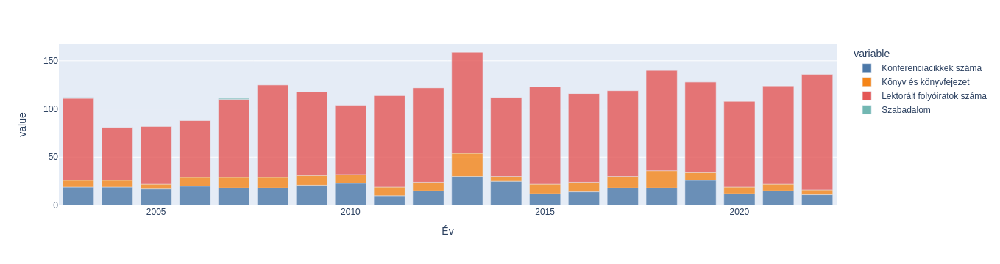

In [8]:
pubyearly = pubfaculty.reset_index()
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

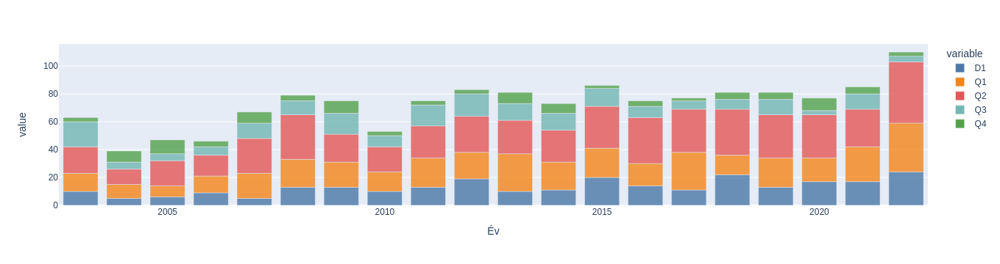

In [9]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

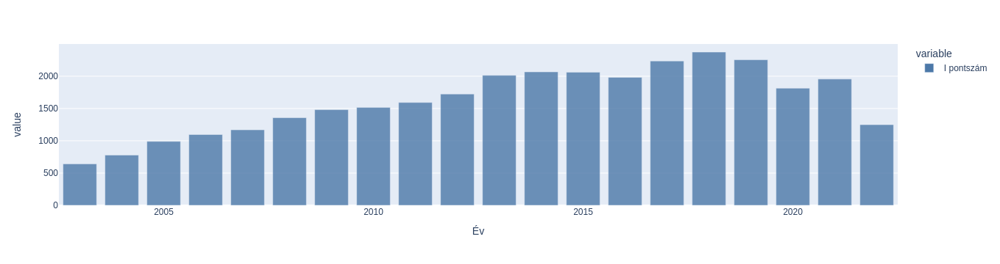

In [10]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

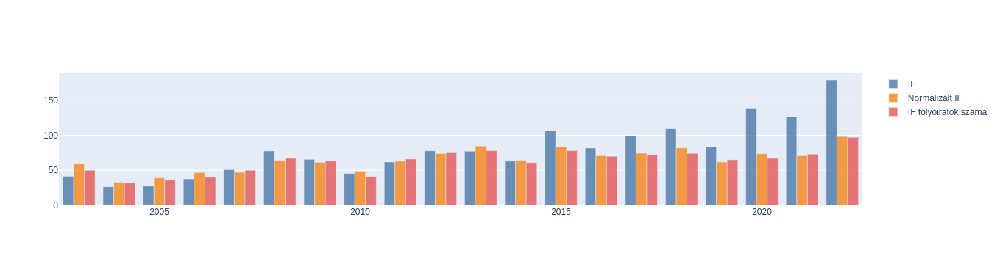

In [11]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

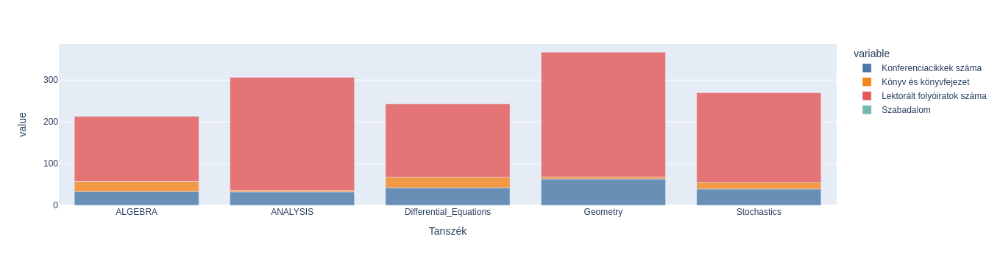

In [12]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2003) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()


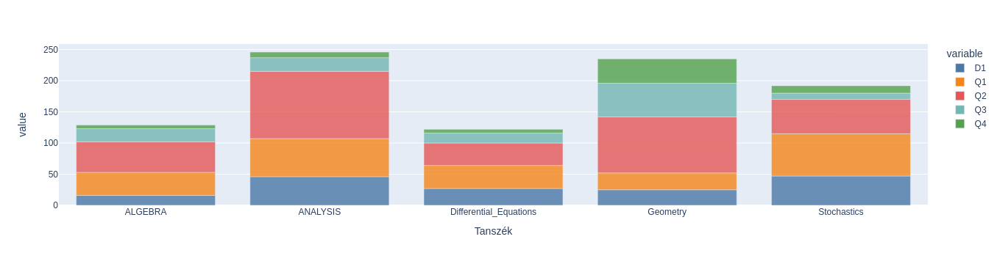

In [13]:
df = pubs
df = df[(df["Év"]>=2003) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

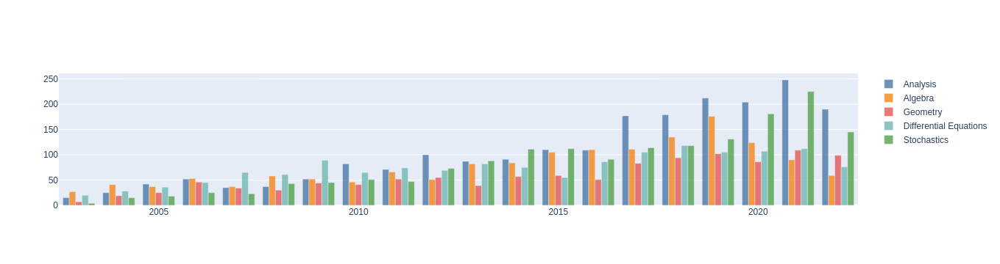

In [14]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()

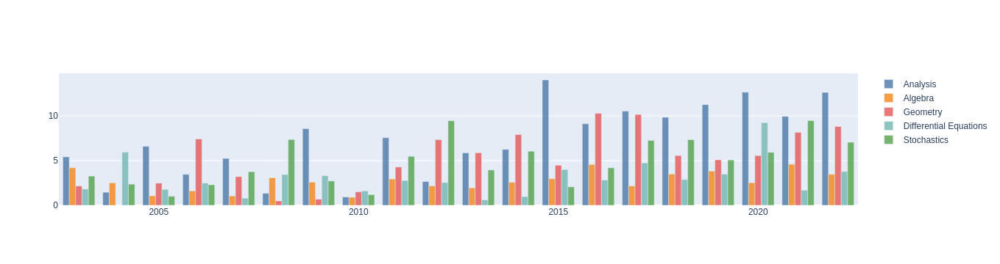

In [15]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["Normalizált IF"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()

## Filter for only the last 5 years

In [12]:
content = []
for fn in glob.glob("./1_1/*.json"):
    pubs = json.load(open(fn))
    content += pubs["content"]

In [13]:
tszmap = {}
#ALGEBRA
#ANALYSIS
#Differential Equations
#Geometry
#Stochastics
tszmap['Algebra Tanszék (BME / TTK / MI)'] = "ALGEBRA"
tszmap['Analízis Tanszék (BME / TTK / MI)'] = "ANALYSIS"
tszmap['Differenciálegyenletek Tanszék (BME / TTK / MI)'] = "Differential_Equations"
tszmap['Geometria Tanszék (BME / TTK / MI)'] = "Geometry"
tszmap['Sztochasztika Tanszék (BME / TTK / MI)'] = "Stochastics"

inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [tszmap[s] for s in a["label"].split("] ")[-1].split("; ") if s in tszmap]
tanszekek = np.unique(inst)
print(tanszekek)

# Ezek pedig a figyelembe nem vett VIK-es affiliációk
inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [s for s in a["label"].split("] ")[-1].split("; ") if "BME / TTK / MI)" in s and s not in tszmap]
nemtanszek = np.unique(inst)
print(nemtanszek)

['ALGEBRA' 'ANALYSIS' 'Differential_Equations' 'Geometry' 'Stochastics']
[]


In [14]:
ifdf = pd.read_csv('./pubgraph/ifdf_v8_2021.csv')
ifdf.loc[ifdf["if"].isnull(), "if"] = 0.0
maxIFYear = ifdf.year.max()
ifdf_e = ifdf.copy().set_index(["year", "eissn"]).sort_index()
ifdf_p = ifdf.copy().set_index(["year", "pissn"]).sort_index()

def getif(pub):
    if "journal" not in pub:
        return 0.0, 1.0
    year = min(pub["publishedYear"], maxIFYear)
    if "pIssn" in pub["journal"]:
        issn = pub["journal"]["pIssn"]
        if (year,issn) in ifdf_p.index:
            ifval = ifdf_p.loc[(year,issn),"if"]
            catif = ifdf_p.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    if "eIssn" in pub["journal"]:
        issn = pub["journal"]["eIssn"]
        if (year,issn) in ifdf_e.index:
            ifval = ifdf_e.loc[(year,issn),"if"]
            catif = ifdf_e.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    return 0.0, 1.0

# a függvény visszaadja a folyóirat rangját (D1, Q1, Q2, ...)
def getrating(pub):
    if "ratings" not in pub:
        return ""
    for r in pub["ratings"]:
        if r["otype"] == "SjrRating" and "ranking" in r:
            return r["ranking"]
    return ""


In [15]:
for pub in content:
    pub["mtmt_title"] = ""
    if "error" in pub and pub["error"] != "VALIDATION_ERROR":
        pub["mtmt_cat"] = "skip - error"
    elif not pub["published"]:
        pub["mtmt_cat"] = "skip - nem published"
    elif "category" not in pub or pub["category"]["label"] != "Tudományos":
        pub["mtmt_cat"] = "skip - nem tudományos"        
    elif pub["otype"] == "JournalArticle" and "journal" in pub:
        if pub["fullPublication"] and "reviewType" in pub["journal"] and pub["journal"]["reviewType"] == "REVIEWED" and "subType" in pub and (pub["subType"]["name"] == "Szakcikk" or pub["subType"]["name"] == "Összefoglaló cikk" or pub["subType"]["name"] == "Konferenciaközlemény" or pub["subType"]["name"] == "Rövid közlemény" or pub["subType"]["name"] == "Sokszerzős vagy csoportos szerzőségű szakcikk"):
            pub["mtmt_cat"] = "journal"
        else:
            pub["mtmt_cat"] = "skip - nem lektorált folyóirat vagy nem értékelhető típus"
    elif pub["fullPublication"] and ((pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and pub["subType"]["label"] == "Konferenciaközlemény (Könyvrészlet)") or pub["type"]["label"] == "Egyéb konferenciaközlemény"):
        pub["mtmt_cat"] = "conference"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["book"]["title"]
    elif pub["type"]["label"] == "Könyv" or (pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and (pub["subType"]["label"] == "Könyvfejezet (Könyvrészlet)" or pub["subType"]["label"] == "Szaktanulmány (Könyvrészlet)")):
        pub["mtmt_cat"] = "book"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["title"]
    elif pub["type"]["label"] == "Oltalmi formák":
        pub["mtmt_cat"] = "patent"
    elif not pub["fullPublication"]:
        pub["mtmt_cat"] = "skip - nem full publication"        
    elif pub["type"]["label"] == "Egyéb" or pub["type"]["label"] == "Disszertáció":
        pub["mtmt_cat"] = "skip - other"
    else:
        pub["mtmt_cat"] = "skip - uncategorized"
    
    # Oldalszám - a túl rövid publikációkat az MTA MTO nem veszi figyelembe
    plength = 0
    if 'pageLength' in pub:
        plength = pub["pageLength"]
    elif 'firstPage' in pub and 'lastPage' in pub and pub["lastPage"].isnumeric() and pub["firstPage"].isnumeric():
        plength = int(pub["lastPage"]) - int(pub["firstPage"]) + 1
    
    # Q pontszám kiszámolása a publikációra, az MTA MTO szabályai szerint
    pub["mtmt_q"] = 0    
    pub["mtmt_norm_q"] = 0    
    pub["mtmt_if"] = 0    
    pub["mtmt_norm_if"] = 0    
    nrm = 1.0
    if pub["mtmt_cat"] == "journal":
        ifct, nrm = getif(pub)        
        pub["mtmt_if"] = ifct
        pub["mtmt_norm_if"] = ifct / nrm
        if ifct > 0:
            pub["mtmt_q"] = max(0.6, ifct)
            pub["mtmt_norm_q"] = max(0.6, pub["mtmt_norm_if"])
        else:
            if pub["foreignEdition"]:
                pub["mtmt_q"] = 0.4
            else:
                pub["mtmt_q"] = 0.3
            pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "conference" and plength >= 4:
        if pub["foreignLanguage"]:
            pub["mtmt_q"] = 0.2
        else:
            pub["mtmt_q"] = 0.1
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "book" and plength >= 10:
        if plength >= 100:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 2
            else:
                pub["mtmt_q"] = 1
        else:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 0.2 * np.floor(plength/10)
            else:
                pub["mtmt_q"] = 0.1 * np.floor(plength/10)            
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    
    # I pontszám kiszámolása, összesen és évenként is
    pub["mtmt_i"] = pub["independentCitationCount"] # teljes eddigi I pontszám
    pub["mtmt_i_year"] = {}
    
    if "pubStats" in pub and "years" in pub["pubStats"]:
        for yr in pub["pubStats"]["years"]:
            pub["mtmt_i_year"][yr["year"]] = yr["independentCitationCount"]
    
    # Tanszék arányok a publikációban
    tszpart = {'ALGEBRA':0, 'ANALYSIS':0, 'Differential_Equations':0, 'Stochastics':0, 'Geometry':0} 
    authors = 0
    if "authorships" in pub:
        for auth in pub["authorships"]:
            if auth["authorTyped"]: # csak szerzőket veszünk figyelembe, szerkesztőket nem!
                authors += 1
                for tsz in tszmap:
                    if tsz in auth["label"]:
                        tszpart[tszmap[tsz]] += 1
                        break
    pub["mtmt_authors"] = authors  # a cikk szerzőinek száma
    if authors > 0:
        for v in tszpart:
            tszpart[v] /= authors
    pub["mtmt_tsz"] = tszpart # a cikkben részt vevő tanszékek aránya
    pub["mtmt_rating"] = getrating(pub)

In [16]:
pubyearly = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=map(list, zip(*itertools.product(tanszekek, range(2003, 2023)))))

dct = pubyearly.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2017, 2023):
        for tsz in tanszekek:
            if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023 and ("publicationPending" not in pub or not pub["publicationPending"]):
                if pub["mtmt_tsz"][tsz] > 0:
                    dct["Q pontszám"][(tsz,year)] += pub["mtmt_q"] * pub["mtmt_tsz"][tsz]
                    dct["Normalizált Q"][(tsz,year)] += pub["mtmt_norm_q"] * pub["mtmt_tsz"][tsz]
                    if pub["mtmt_if"] > 0:
                        dct["IF"][(tsz,year)] += pub["mtmt_if"] * pub["mtmt_tsz"][tsz]         
                        dct["Normalizált IF"][(tsz,year)] += pub["mtmt_norm_if"] * pub["mtmt_tsz"][tsz]         
                    if pub["mtmt_cat"] == "journal":
                        dct["Lektorált folyóiratok száma"][(tsz,year)] += 1                
                        if pub["mtmt_if"] > 0:
                            dct["IF folyóiratok száma"][(tsz,year)] += 1
                        rating = getrating(pub)
                        if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                            dct[rating][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "conference":
                        dct["Konferenciacikkek száma"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "book":
                        dct["Könyv és könyvfejezet"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "patent":
                        dct["Szabadalom"][(tsz,year)] += 1
                    dct["Publikációk száma"][(tsz,year)] += 1            
            if pub["mtmt_tsz"][tsz] > 0 and year in pub["mtmt_i_year"]:
                dct["I pontszám"][(tsz,year)] += pub["mtmt_i_year"][year]
                
pubyearly = pubyearly.from_dict(dct)
pubyearly.index.set_names(["Tanszék", "Év"], inplace=True)
pubyearly

Q pontszám  Normalizált Q  I pontszám         IF  \
Tanszék     Év                                                       
ALGEBRA     2003    0.000000       0.000000           0   0.000000   
            2004    0.000000       0.000000           0   0.000000   
            2005    0.000000       0.000000           0   0.000000   
            2006    0.000000       0.000000           0   0.000000   
            2007    0.000000       0.000000           0   0.000000   
...                      ...            ...         ...        ...   
Stochastics 2018    9.714750       8.203785         118   8.860750   
            2019    9.167167       8.152144         131   6.081167   
            2020   10.639833       6.622526         181   9.964833   
            2021   22.404917      14.313940         225  17.653250   
            2022   12.159097       7.939029         145  11.371319   

                  Normalizált IF  Publikációk száma  \
Tanszék     Év                                        
ALGEBRA     2003        0.000000                  0   
            2004        0.000000                  0   
            2005        0.000000                  0   
            2006        0.000000                  0   
            2007        0.000000                  0   
...                          ...                ...   
Stochastics 2018        7.340532                 26   
            2019        5.072144                 30   
            2020        5.927123                 17   
            2021        9.476379                 30   
            2022        7.051187                 22   

                  Lektorált folyóiratok száma  Konferenciacikkek száma  \
Tanszék     Év                                                           
ALGEBRA     2003                            0                        0   
            2004                            0                        0   
            2005                            0                        0   
            2006                            0                        0   
            2007                            0                        0   
...                                       ...                      ...   
Stochastics 2018                           17                        2   
            2019                           18                        9   
            2020                           12                        2   
            2021                           23                        2   
            2022                           19                        0   

                  Könyv és könyvfejezet  Szabadalom  IF folyóiratok száma  D1  \
Tanszék     Év                                                                  
ALGEBRA     2003                      0           0                     0   0   
            2004                      0           0                     0   0   
            2005                      0           0                     0   0   
            2006                      0           0                     0   0   
            2007                      0           0                     0   0   
...                                 ...         ...                   ...  ..   
Stochastics 2018                      3           0                    16   9   
            2019                      0           0                    10   3   
            2020                      1           0                    11   5   
            2021                      2           0                    15   6   
            2022                      2           0                    15   4   

                  Q1  Q2  Q3  Q4  
Tanszék     Év                    
ALGEBRA     2003   0   0   0   0  
            2004   0   0   0   0  
            2005   0   0   0   0  
            2006   0   0   0   0  
            2007   0   0   0   0  
...               ..  ..  ..  ..  
Stochastics 2018   2   5   0   0  
            2019   6   3   2   0  
            2020   3   3

In [17]:
pubfaculty = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=list(range(2003,2023)))

dct = pubfaculty.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2017, 2023):
        if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023:
            dct["Q pontszám"][year] += pub["mtmt_q"]
            dct["Normalizált Q"][year] += pub["mtmt_norm_q"]
            if pub["mtmt_if"] > 0:
                dct["IF"][year] += pub["mtmt_if"]
                dct["Normalizált IF"][year] += pub["mtmt_norm_if"]
            if pub["mtmt_cat"] == "journal":
                dct["Lektorált folyóiratok száma"][year] += 1                
                if pub["mtmt_if"] > 0:
                    dct["IF folyóiratok száma"][year] += 1
                rating = getrating(pub)
                if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                    dct[rating][year] += 1
            if pub["mtmt_cat"] == "conference":
                dct["Konferenciacikkek száma"][year] += 1
            if pub["mtmt_cat"] == "book":
                dct["Könyv és könyvfejezet"][year] += 1
            if pub["mtmt_cat"] == "patent":
                dct["Szabadalom"][year] += 1
            dct["Publikációk száma"][year] += 1            
        if year in pub["mtmt_i_year"]:
            dct["I pontszám"][year] += pub["mtmt_i_year"][year]
                
pubfaculty = pubfaculty.from_dict(dct)
pubfaculty.index.set_names("Év", inplace=True)

pubfaculty

,Q pontszám,Normalizált Q,I pontszám,IF,Normalizált IF,Publikációk száma,Lektorált folyóiratok száma,Konferenciacikkek száma,Könyv és könyvfejezet,Szabadalom,IF folyóiratok száma,D1,Q1,Q2,Q3,Q4
Év,,,,,,,,,,,,,,,,
2003,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2004,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2005,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2006,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2007,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2008,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2009,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2010,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2011,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0


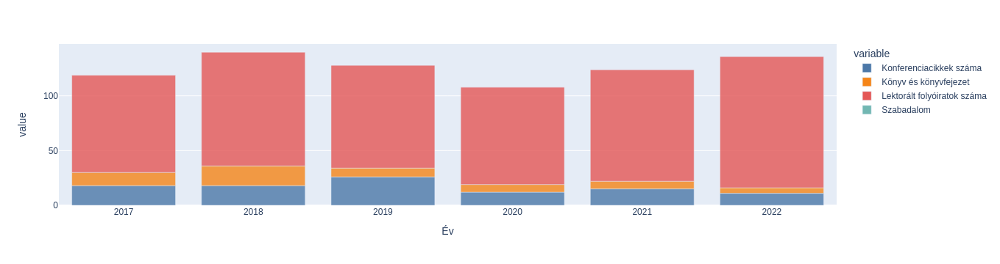

In [18]:
pubyearly = pubfaculty.reset_index()
pubyearly = pubyearly[pubyearly['Év'] > 2016]
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

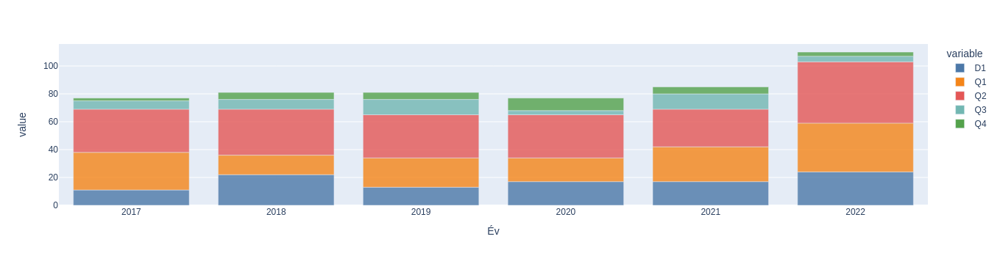

In [19]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

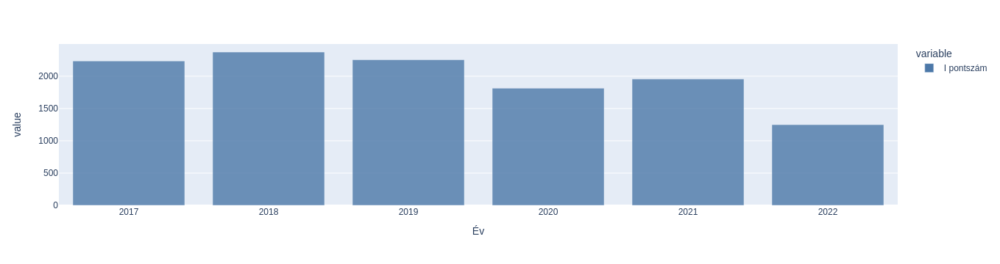

In [20]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

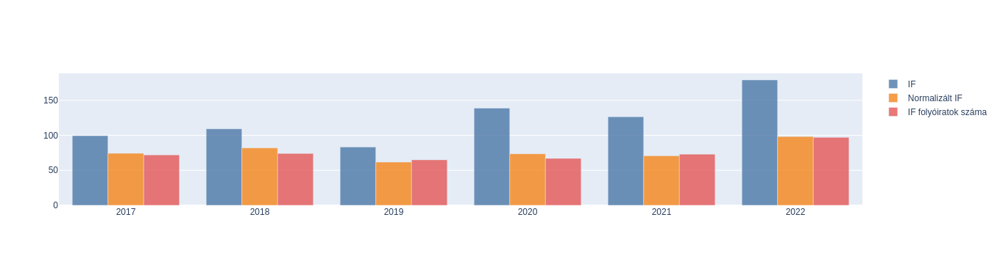

In [21]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

In [22]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()



KeyError: 'Tanszék'

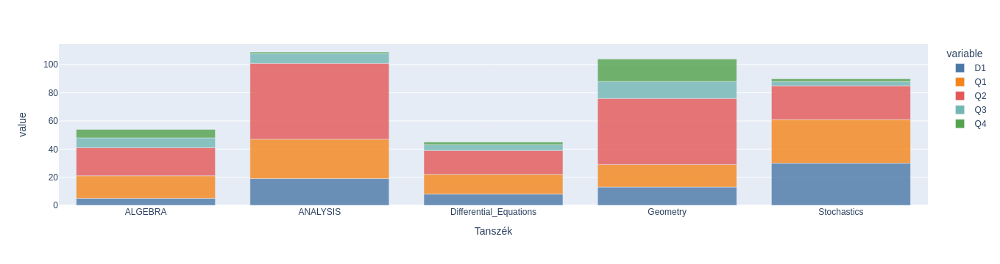

In [26]:
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

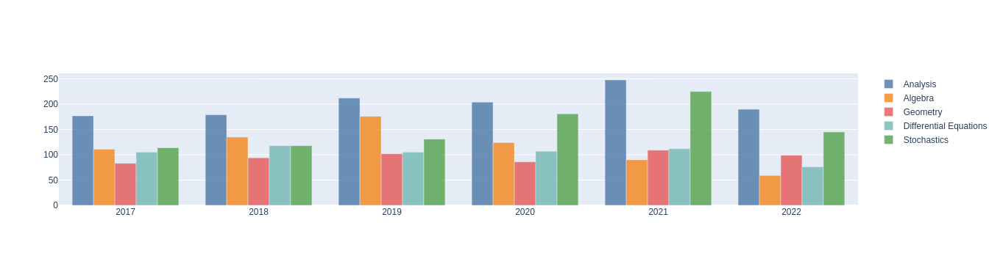

In [27]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()

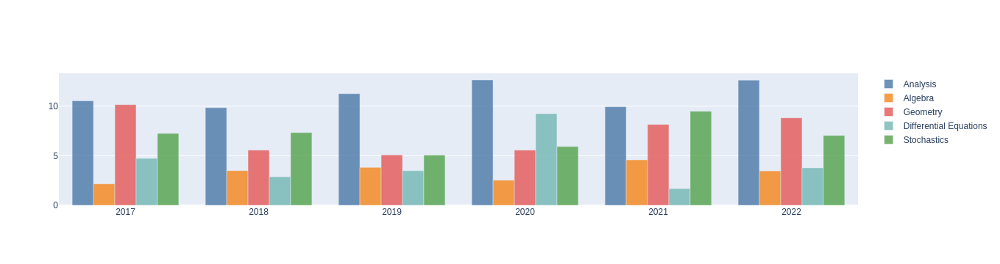

In [28]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["Normalizált IF"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()

# We only focus on our current colleagues but only check those papers that were written at the institute of mathematics. For example, if the head of the department had a paper in 1996 at another university, then we don't consider that paper in this case. 

## Calculate the metrics for all these papers. 

In [29]:

mtid="10012522,10041405,10011729,10042381,10011669,,10042216,10070052,10042206,10004672,10043154,10063931,10013078,10042246,10046850,10000951,10077397,10085337,10057699,10028223,10010616,10004964,10041238,10003438,10022680,10010572,10011985,10078413,10002331,10041425,10068236,10041406,10003450,10027650,10001247,10000182,10003616,10049654,10028073,10000168,10078429,10050580,10025398,10041428,10019177,10042217,10083060,10011896,10002205,10031107,10060734,10031961,10007872,10017841,10012191,10042205,10032461,10046700,10009038,10011812,10011720,10048502,10028363,10006497,10000799,10052318,10051932,10011727,10042404,10041699,10002058,10000486,10001060,10045285,10041426,10066588,10034810,10000476,10012374,10035521,10084870,10028381,10011667,10065149,10009305,10003409,10065152,10000407,10011665,10011721,10012192,10041399,10001238,10000434,10082160,10041404,10044622,10010416,10023210,10027379,10001251,10000937,10041403,10070736,10011668,10029438,10066279,10058012,10010951,10070026,10019822,10000734,10042772,10058310,10011734,10019824,10019824,10042219,10015273,10009327"                   
for year in range(1990, 2023):
    page = 1
    while True:
        fName = f"./2_1/mtmtpubs-{year}-{page}.json"
        enYear = year
        stYear = 1900 if year <= 1990 else year
        os.system(f'wget -O {fName} "https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=institutes;inia;10856&cond=authors.mtid;in;{mtid}&cond=publishedYear;range;{stYear}%2C{enYear}&sort=publishedYear,desc&sort=firstAuthor,asc&page={page}&size=1000&fields=citations,pubStats&labelLang=hun&cite_type=2"')
        with open(fName, "r") as f:
            try:
                dta = json.load(f)
                if not dta["paging"]["last"]:
                    page += 1
                else:
                    break
            except:
                print("Error, retrying")
                pass




--2023-01-30 16:31:17--  https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=institutes;inia;10856&cond=authors.mtid;in;10012522,10041405,10011729,10042381,10011669,,10042216,10070052,10042206,10004672,10043154,10063931,10013078,10042246,10046850,10000951,10077397,10085337,10057699,10028223,10010616,10004964,10041238,10003438,10022680,10010572,10011985,10078413,10002331,10041425,10068236,10041406,10003450,10027650,10001247,10000182,10003616,10049654,10028073,10000168,10078429,10050580,10025398,10041428,10019177,10042217,10083060,10011896,10002205,10031107,10060734,10031961,10007872,10017841,10012191,10042205,10032461,10046700,10009038,10011812,10011720,10048502,10028363,10006497,10000799,10052318,10051932,10011727,10042404,10041699,10002058,10000486,10001060,10045285,10041426,10066588,10034810,10000476,10012374,10035521,10084870,10028381,10011667,10065149,10009305,10003409,10065152,10000407,10011665,10011721,10012192,10041399,10001238,10000434,10082160,1004

In [8]:
content = []
for fn in glob.glob("./2_1/*.json"):
    pubs = json.load(open(fn))
    content += pubs["content"]

In [9]:
tszmap = {}
#ALGEBRA
#ANALYSIS
#Differential Equations
#Geometry
#Stochastics
tszmap['Algebra Tanszék (BME / TTK / MI)'] = "ALGEBRA"
tszmap['Analízis Tanszék (BME / TTK / MI)'] = "ANALYSIS"
tszmap['Differenciálegyenletek Tanszék (BME / TTK / MI)'] = "Differential_Equations"
tszmap['Geometria Tanszék (BME / TTK / MI)'] = "Geometry"
tszmap['Sztochasztika Tanszék (BME / TTK / MI)'] = "Stochastics"

inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [tszmap[s] for s in a["label"].split("] ")[-1].split("; ") if s in tszmap]
tanszekek = np.unique(inst)
print(tanszekek)

# Ezek pedig a figyelembe nem vett VIK-es affiliációk
inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [s for s in a["label"].split("] ")[-1].split("; ") if "BME / TTK / MI)" in s and s not in tszmap]
nemtanszek = np.unique(inst)
print(nemtanszek)

['ALGEBRA' 'ANALYSIS' 'Differential_Equations' 'Geometry' 'Stochastics']
[]


In [10]:
ifdf = pd.read_csv('./pubgraph/ifdf_v8_2021.csv')
ifdf.loc[ifdf["if"].isnull(), "if"] = 0.0
maxIFYear = ifdf.year.max()
ifdf_e = ifdf.copy().set_index(["year", "eissn"]).sort_index()
ifdf_p = ifdf.copy().set_index(["year", "pissn"]).sort_index()

def getif(pub):
    if "journal" not in pub:
        return 0.0, 1.0
    year = min(pub["publishedYear"], maxIFYear)
    if "pIssn" in pub["journal"]:
        issn = pub["journal"]["pIssn"]
        if (year,issn) in ifdf_p.index:
            ifval = ifdf_p.loc[(year,issn),"if"]
            catif = ifdf_p.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    if "eIssn" in pub["journal"]:
        issn = pub["journal"]["eIssn"]
        if (year,issn) in ifdf_e.index:
            ifval = ifdf_e.loc[(year,issn),"if"]
            catif = ifdf_e.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    return 0.0, 1.0

# a függvény visszaadja a folyóirat rangját (D1, Q1, Q2, ...)
def getrating(pub):
    if "ratings" not in pub:
        return ""
    for r in pub["ratings"]:
        if r["otype"] == "SjrRating" and "ranking" in r:
            return r["ranking"]
    return ""


In [11]:
for pub in content:
    pub["mtmt_title"] = ""
    if "error" in pub and pub["error"] != "VALIDATION_ERROR":
        pub["mtmt_cat"] = "skip - error"
    elif not pub["published"]:
        pub["mtmt_cat"] = "skip - nem published"
    elif "category" not in pub or pub["category"]["label"] != "Tudományos":
        pub["mtmt_cat"] = "skip - nem tudományos"        
    elif pub["otype"] == "JournalArticle" and "journal" in pub:
        if pub["fullPublication"] and "reviewType" in pub["journal"] and pub["journal"]["reviewType"] == "REVIEWED" and "subType" in pub and (pub["subType"]["name"] == "Szakcikk" or pub["subType"]["name"] == "Összefoglaló cikk" or pub["subType"]["name"] == "Konferenciaközlemény" or pub["subType"]["name"] == "Rövid közlemény" or pub["subType"]["name"] == "Sokszerzős vagy csoportos szerzőségű szakcikk"):
            pub["mtmt_cat"] = "journal"
        else:
            pub["mtmt_cat"] = "skip - nem lektorált folyóirat vagy nem értékelhető típus"
    elif pub["fullPublication"] and ((pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and pub["subType"]["label"] == "Konferenciaközlemény (Könyvrészlet)") or pub["type"]["label"] == "Egyéb konferenciaközlemény"):
        pub["mtmt_cat"] = "conference"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["book"]["title"]
    elif pub["type"]["label"] == "Könyv" or (pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and (pub["subType"]["label"] == "Könyvfejezet (Könyvrészlet)" or pub["subType"]["label"] == "Szaktanulmány (Könyvrészlet)")):
        pub["mtmt_cat"] = "book"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["title"]
    elif pub["type"]["label"] == "Oltalmi formák":
        pub["mtmt_cat"] = "patent"
    elif not pub["fullPublication"]:
        pub["mtmt_cat"] = "skip - nem full publication"        
    elif pub["type"]["label"] == "Egyéb" or pub["type"]["label"] == "Disszertáció":
        pub["mtmt_cat"] = "skip - other"
    else:
        pub["mtmt_cat"] = "skip - uncategorized"
    
    # Oldalszám - a túl rövid publikációkat az MTA MTO nem veszi figyelembe
    plength = 0
    if 'pageLength' in pub:
        plength = pub["pageLength"]
    elif 'firstPage' in pub and 'lastPage' in pub and pub["lastPage"].isnumeric() and pub["firstPage"].isnumeric():
        plength = int(pub["lastPage"]) - int(pub["firstPage"]) + 1
    
    # Q pontszám kiszámolása a publikációra, az MTA MTO szabályai szerint
    pub["mtmt_q"] = 0    
    pub["mtmt_norm_q"] = 0    
    pub["mtmt_if"] = 0    
    pub["mtmt_norm_if"] = 0    
    nrm = 1.0
    if pub["mtmt_cat"] == "journal":
        ifct, nrm = getif(pub)        
        pub["mtmt_if"] = ifct
        pub["mtmt_norm_if"] = ifct / nrm
        if ifct > 0:
            pub["mtmt_q"] = max(0.6, ifct)
            pub["mtmt_norm_q"] = max(0.6, pub["mtmt_norm_if"])
        else:
            if pub["foreignEdition"]:
                pub["mtmt_q"] = 0.4
            else:
                pub["mtmt_q"] = 0.3
            pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "conference" and plength >= 4:
        if pub["foreignLanguage"]:
            pub["mtmt_q"] = 0.2
        else:
            pub["mtmt_q"] = 0.1
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "book" and plength >= 10:
        if plength >= 100:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 2
            else:
                pub["mtmt_q"] = 1
        else:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 0.2 * np.floor(plength/10)
            else:
                pub["mtmt_q"] = 0.1 * np.floor(plength/10)            
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    
    # I pontszám kiszámolása, összesen és évenként is
    pub["mtmt_i"] = pub["independentCitationCount"] # teljes eddigi I pontszám
    pub["mtmt_i_year"] = {}
    
    if "pubStats" in pub and "years" in pub["pubStats"]:
        for yr in pub["pubStats"]["years"]:
            pub["mtmt_i_year"][yr["year"]] = yr["independentCitationCount"]
    
    # Tanszék arányok a publikációban
    tszpart = {'ALGEBRA':0, 'ANALYSIS':0, 'Differential_Equations':0, 'Stochastics':0, 'Geometry':0} 
    authors = 0
    if "authorships" in pub:
        for auth in pub["authorships"]:
            if auth["authorTyped"]: # csak szerzőket veszünk figyelembe, szerkesztőket nem!
                authors += 1
                for tsz in tszmap:
                    if tsz in auth["label"]:
                        tszpart[tszmap[tsz]] += 1
                        break
    pub["mtmt_authors"] = authors  # a cikk szerzőinek száma
    if authors > 0:
        for v in tszpart:
            tszpart[v] /= authors
    pub["mtmt_tsz"] = tszpart # a cikkben részt vevő tanszékek aránya
    pub["mtmt_rating"] = getrating(pub)


In [12]:
pubyearly = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=map(list, zip(*itertools.product(tanszekek, range(2003, 2023)))))

dct = pubyearly.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        for tsz in tanszekek:
            if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023 and ("publicationPending" not in pub or not pub["publicationPending"]):
                if pub["mtmt_tsz"][tsz] > 0:
                    dct["Q pontszám"][(tsz,year)] += pub["mtmt_q"] * pub["mtmt_tsz"][tsz]
                    dct["Normalizált Q"][(tsz,year)] += pub["mtmt_norm_q"] * pub["mtmt_tsz"][tsz]
                    if pub["mtmt_if"] > 0:
                        dct["IF"][(tsz,year)] += pub["mtmt_if"] * pub["mtmt_tsz"][tsz]         
                        dct["Normalizált IF"][(tsz,year)] += pub["mtmt_norm_if"] * pub["mtmt_tsz"][tsz]         
                    if pub["mtmt_cat"] == "journal":
                        dct["Lektorált folyóiratok száma"][(tsz,year)] += 1                
                        if pub["mtmt_if"] > 0:
                            dct["IF folyóiratok száma"][(tsz,year)] += 1
                        rating = getrating(pub)
                        if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                            dct[rating][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "conference":
                        dct["Konferenciacikkek száma"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "book":
                        dct["Könyv és könyvfejezet"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "patent":
                        dct["Szabadalom"][(tsz,year)] += 1
                    dct["Publikációk száma"][(tsz,year)] += 1            
            if pub["mtmt_tsz"][tsz] > 0 and year in pub["mtmt_i_year"]:
                dct["I pontszám"][(tsz,year)] += pub["mtmt_i_year"][year]
                
pubyearly = pubyearly.from_dict(dct)
pubyearly.index.set_names(["Tanszék", "Év"], inplace=True)


pubyearly

Q pontszám  Normalizált Q  I pontszám         IF  \
Tanszék     Év                                                       
ALGEBRA     2003    2.757667       4.902917          27   1.681167   
            2004    2.833333       3.498144          41   1.082833   
            2005    2.083333       2.348693          37   0.489000   
            2006    1.620333       2.082353          53   0.860200   
            2007    1.186333       1.396321          37   0.660333   
...                      ...            ...         ...        ...   
Stochastics 2018    9.714750       8.203785         118   8.860750   
            2019    9.167167       8.152144         131   6.081167   
            2020   10.639833       6.622526         181   9.964833   
            2021   22.404917      14.313940         225  17.653250   
            2022   12.159097       7.939029         145  11.371319   

                  Normalizált IF  Publikációk száma  \
Tanszék     Év                                        
ALGEBRA     2003        4.202917                 12   
            2004        2.512374                 10   
            2005        1.065359                 11   
            2006        1.615686                  7   
            2007        1.046321                  7   
...                          ...                ...   
Stochastics 2018        7.340532                 26   
            2019        5.072144                 30   
            2020        5.927123                 17   
            2021        9.476379                 30   
            2022        7.051187                 22   

                  Lektorált folyóiratok száma  Konferenciacikkek száma  \
Tanszék     Év                                                           
ALGEBRA     2003                            9                        0   
            2004                            6                        0   
            2005                            6                        1   
            2006                            4                        2   
            2007                            3                        1   
...                                       ...                      ...   
Stochastics 2018                           17                        2   
            2019                           18                        9   
            2020                           12                        2   
            2021                           23                        2   
            2022                           19                        0   

                  Könyv és könyvfejezet  Szabadalom  IF folyóiratok száma  D1  \
Tanszék     Év                                                                  
ALGEBRA     2003                      2           1                     6   1   
            2004                      2           0                     4   1   
            2005                      1           0                     3   0   
            2006                      1           0                     4   0   
            2007                      0           0                     2   0   
...                                 ...         ...                   ...  ..   
Stochastics 2018                      3           0                    16   9   
            2019                      0           0                    10   3   
            2020                      1           0                    11   5   
            2021                      2           0                    15   6   
            2022                      2           0                    15   4   

                  Q1  Q2  Q3  Q4  
Tanszék     Év                    
ALGEBRA     2003   4   1   0   0  
            2004   0   2   1   0  
            2005   1   2   1   0  
            2006   1   3   0   0  
            2007   1   1   1   0  
...               ..  ..  ..  ..  
Stochastics 2018   2   5   0   0  
            2019   6   3   2   0  
            2020   3   3

In [13]:
pubfaculty = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=list(range(2003,2023)))

dct = pubfaculty.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023:
            dct["Q pontszám"][year] += pub["mtmt_q"]
            dct["Normalizált Q"][year] += pub["mtmt_norm_q"]
            if pub["mtmt_if"] > 0:
                dct["IF"][year] += pub["mtmt_if"]
                dct["Normalizált IF"][year] += pub["mtmt_norm_if"]
            if pub["mtmt_cat"] == "journal":
                dct["Lektorált folyóiratok száma"][year] += 1                
                if pub["mtmt_if"] > 0:
                    dct["IF folyóiratok száma"][year] += 1
                rating = getrating(pub)
                if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                    dct[rating][year] += 1
            if pub["mtmt_cat"] == "conference":
                dct["Konferenciacikkek száma"][year] += 1
            if pub["mtmt_cat"] == "book":
                dct["Könyv és könyvfejezet"][year] += 1
            if pub["mtmt_cat"] == "patent":
                dct["Szabadalom"][year] += 1
            dct["Publikációk száma"][year] += 1            
        if year in pub["mtmt_i_year"]:
            dct["I pontszám"][year] += pub["mtmt_i_year"][year]
                
pubfaculty = pubfaculty.from_dict(dct)
pubfaculty.index.set_names("Év", inplace=True)

pubfaculty

,Q pontszám,Normalizált Q,I pontszám,IF,Normalizált IF,Publikációk száma,Lektorált folyóiratok száma,Konferenciacikkek száma,Könyv és könyvfejezet,Szabadalom,IF folyóiratok száma,D1,Q1,Q2,Q3,Q4
Év,,,,,,,,,,,,,,,,
2003,30.970,40.442107,74,19.098,31.642107,71,47,11,4,1,27,4,9,11,13,0
2004,29.851,33.258375,131,18.669,24.157214,63,38,10,3,0,21,4,8,6,2,7
2005,21.699,26.396193,160,12.414,18.096193,51,26,8,2,0,13,4,6,3,1,5
2006,35.133,36.087022,233,23.712,26.663419,55,33,9,5,0,23,5,7,8,4,2
2007,36.653,31.501265,207,26.541,21.767455,64,40,8,3,0,25,1,9,13,6,4
2008,44.437,39.494822,238,31.315,25.971091,71,50,9,6,0,28,6,11,10,5,4
2009,42.453,39.983030,284,32.183,29.604525,71,46,6,4,0,29,8,6,11,7,6
2010,22.244,21.578382,288,12.675,11.552208,62,31,12,2,0,13,2,5,6,5,0
2011,45.510,44.141624,330,33.882,33.738144,93,57,8,1,0,36,8,12,13,8,2


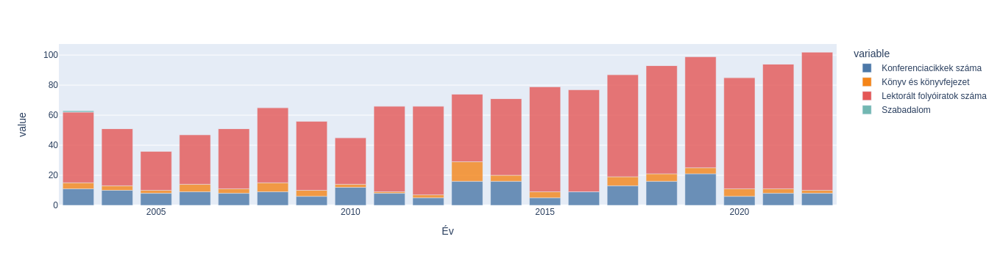

In [14]:
pubyearly = pubfaculty.reset_index()
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()


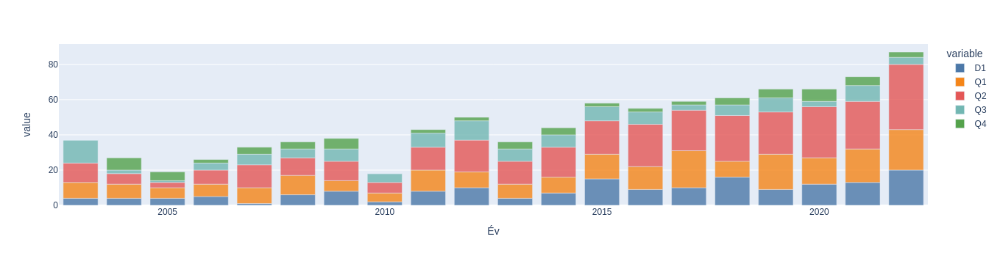

In [15]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

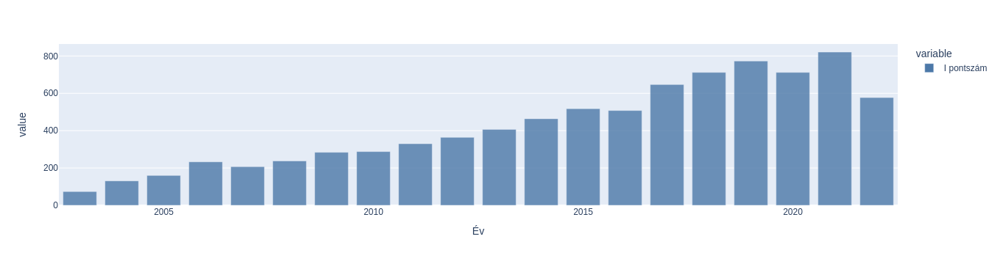

In [16]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

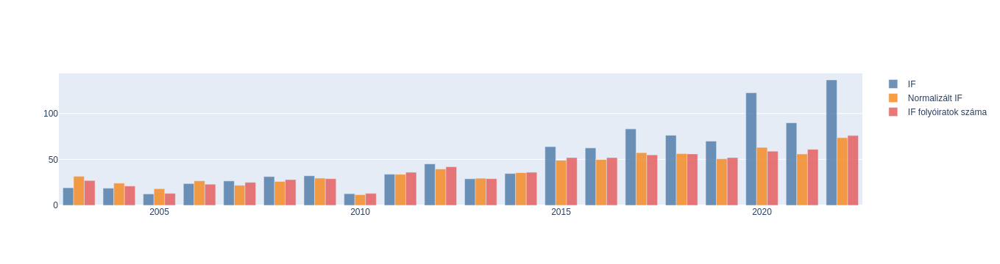

In [17]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

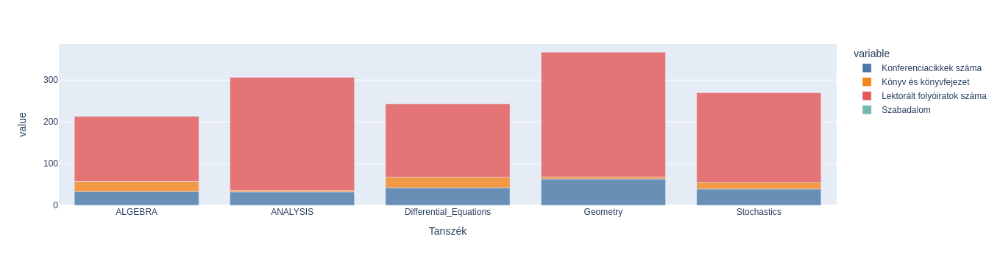

In [39]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2003) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()




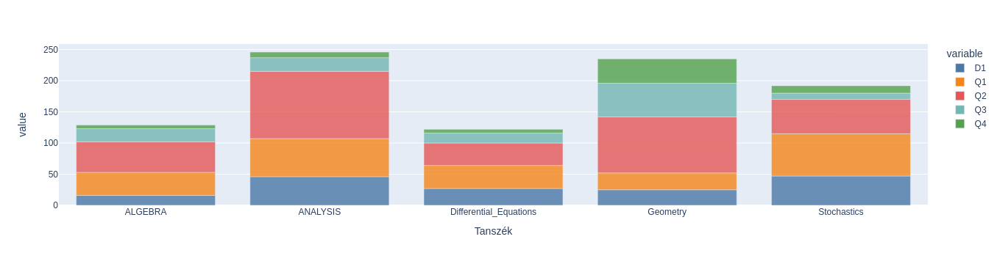

In [40]:
df = pubs
df = df[(df["Év"]>=2003) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

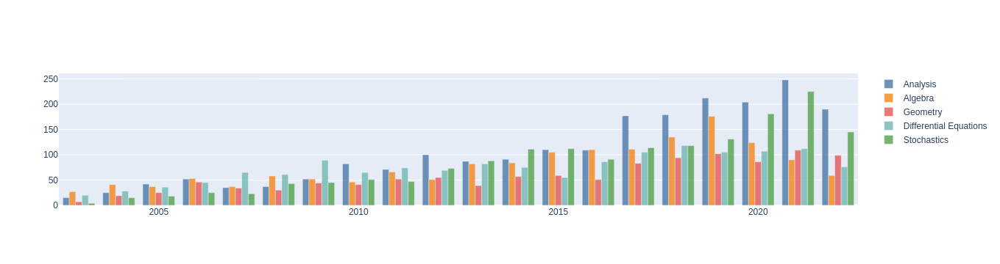

In [41]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()

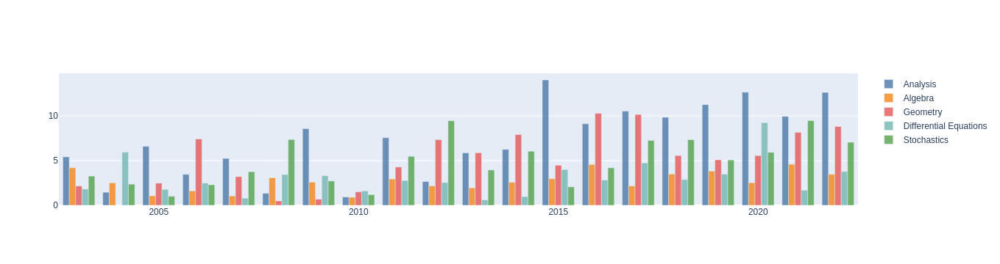

In [42]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["Normalizált IF"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()

## Filter for only the last 5 years

In [18]:
content = []
for fn in glob.glob("./2_1/*.json"):
    pubs = json.load(open(fn))
    content += pubs["content"]

In [19]:
tszmap = {}
#ALGEBRA
#ANALYSIS
#Differential Equations
#Geometry
#Stochastics
tszmap['Algebra Tanszék (BME / TTK / MI)'] = "ALGEBRA"
tszmap['Analízis Tanszék (BME / TTK / MI)'] = "ANALYSIS"
tszmap['Differenciálegyenletek Tanszék (BME / TTK / MI)'] = "Differential_Equations"
tszmap['Geometria Tanszék (BME / TTK / MI)'] = "Geometry"
tszmap['Sztochasztika Tanszék (BME / TTK / MI)'] = "Stochastics"

inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [tszmap[s] for s in a["label"].split("] ")[-1].split("; ") if s in tszmap]
tanszekek = np.unique(inst)
print(tanszekek)

# Ezek pedig a figyelembe nem vett VIK-es affiliációk
inst = []
for c in content:
    if "authorships" in c:
        for a in c["authorships"]:
            if a["label"].find("] ") >= 0:
                inst = inst + [s for s in a["label"].split("] ")[-1].split("; ") if "BME / TTK / MI)" in s and s not in tszmap]
nemtanszek = np.unique(inst)
print(nemtanszek)

['ALGEBRA' 'ANALYSIS' 'Differential_Equations' 'Geometry' 'Stochastics']
[]


In [20]:
ifdf = pd.read_csv('./pubgraph/ifdf_v8_2021.csv')
ifdf.loc[ifdf["if"].isnull(), "if"] = 0.0
maxIFYear = ifdf.year.max()
ifdf_e = ifdf.copy().set_index(["year", "eissn"]).sort_index()
ifdf_p = ifdf.copy().set_index(["year", "pissn"]).sort_index()

def getif(pub):
    if "journal" not in pub:
        return 0.0, 1.0
    year = min(pub["publishedYear"], maxIFYear)
    if "pIssn" in pub["journal"]:
        issn = pub["journal"]["pIssn"]
        if (year,issn) in ifdf_p.index:
            ifval = ifdf_p.loc[(year,issn),"if"]
            catif = ifdf_p.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    if "eIssn" in pub["journal"]:
        issn = pub["journal"]["eIssn"]
        if (year,issn) in ifdf_e.index:
            ifval = ifdf_e.loc[(year,issn),"if"]
            catif = ifdf_e.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    return 0.0, 1.0

# a függvény visszaadja a folyóirat rangját (D1, Q1, Q2, ...)
def getrating(pub):
    if "ratings" not in pub:
        return ""
    for r in pub["ratings"]:
        if r["otype"] == "SjrRating" and "ranking" in r:
            return r["ranking"]
    return ""


In [21]:
for pub in content:
    pub["mtmt_title"] = ""
    if "error" in pub and pub["error"] != "VALIDATION_ERROR":
        pub["mtmt_cat"] = "skip - error"
    elif not pub["published"]:
        pub["mtmt_cat"] = "skip - nem published"
    elif "category" not in pub or pub["category"]["label"] != "Tudományos":
        pub["mtmt_cat"] = "skip - nem tudományos"        
    elif pub["otype"] == "JournalArticle" and "journal" in pub:
        if pub["fullPublication"] and "reviewType" in pub["journal"] and pub["journal"]["reviewType"] == "REVIEWED" and "subType" in pub and (pub["subType"]["name"] == "Szakcikk" or pub["subType"]["name"] == "Összefoglaló cikk" or pub["subType"]["name"] == "Konferenciaközlemény" or pub["subType"]["name"] == "Rövid közlemény" or pub["subType"]["name"] == "Sokszerzős vagy csoportos szerzőségű szakcikk"):
            pub["mtmt_cat"] = "journal"
        else:
            pub["mtmt_cat"] = "skip - nem lektorált folyóirat vagy nem értékelhető típus"
    elif pub["fullPublication"] and ((pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and pub["subType"]["label"] == "Konferenciaközlemény (Könyvrészlet)") or pub["type"]["label"] == "Egyéb konferenciaközlemény"):
        pub["mtmt_cat"] = "conference"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["book"]["title"]
    elif pub["type"]["label"] == "Könyv" or (pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and (pub["subType"]["label"] == "Könyvfejezet (Könyvrészlet)" or pub["subType"]["label"] == "Szaktanulmány (Könyvrészlet)")):
        pub["mtmt_cat"] = "book"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["title"]
    elif pub["type"]["label"] == "Oltalmi formák":
        pub["mtmt_cat"] = "patent"
    elif not pub["fullPublication"]:
        pub["mtmt_cat"] = "skip - nem full publication"        
    elif pub["type"]["label"] == "Egyéb" or pub["type"]["label"] == "Disszertáció":
        pub["mtmt_cat"] = "skip - other"
    else:
        pub["mtmt_cat"] = "skip - uncategorized"
    
    # Oldalszám - a túl rövid publikációkat az MTA MTO nem veszi figyelembe
    plength = 0
    if 'pageLength' in pub:
        plength = pub["pageLength"]
    elif 'firstPage' in pub and 'lastPage' in pub and pub["lastPage"].isnumeric() and pub["firstPage"].isnumeric():
        plength = int(pub["lastPage"]) - int(pub["firstPage"]) + 1
    
    # Q pontszám kiszámolása a publikációra, az MTA MTO szabályai szerint
    pub["mtmt_q"] = 0    
    pub["mtmt_norm_q"] = 0    
    pub["mtmt_if"] = 0    
    pub["mtmt_norm_if"] = 0    
    nrm = 1.0
    if pub["mtmt_cat"] == "journal":
        ifct, nrm = getif(pub)        
        pub["mtmt_if"] = ifct
        pub["mtmt_norm_if"] = ifct / nrm
        if ifct > 0:
            pub["mtmt_q"] = max(0.6, ifct)
            pub["mtmt_norm_q"] = max(0.6, pub["mtmt_norm_if"])
        else:
            if pub["foreignEdition"]:
                pub["mtmt_q"] = 0.4
            else:
                pub["mtmt_q"] = 0.3
            pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "conference" and plength >= 4:
        if pub["foreignLanguage"]:
            pub["mtmt_q"] = 0.2
        else:
            pub["mtmt_q"] = 0.1
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "book" and plength >= 10:
        if plength >= 100:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 2
            else:
                pub["mtmt_q"] = 1
        else:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 0.2 * np.floor(plength/10)
            else:
                pub["mtmt_q"] = 0.1 * np.floor(plength/10)            
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    
    # I pontszám kiszámolása, összesen és évenként is
    pub["mtmt_i"] = pub["independentCitationCount"] # teljes eddigi I pontszám
    pub["mtmt_i_year"] = {}
    
    if "pubStats" in pub and "years" in pub["pubStats"]:
        for yr in pub["pubStats"]["years"]:
            pub["mtmt_i_year"][yr["year"]] = yr["independentCitationCount"]
    
    # Tanszék arányok a publikációban
    tszpart = {'ALGEBRA':0, 'ANALYSIS':0, 'Differential_Equations':0, 'Stochastics':0, 'Geometry':0} 
    authors = 0
    if "authorships" in pub:
        for auth in pub["authorships"]:
            if auth["authorTyped"]: # csak szerzőket veszünk figyelembe, szerkesztőket nem!
                authors += 1
                for tsz in tszmap:
                    if tsz in auth["label"]:
                        tszpart[tszmap[tsz]] += 1
                        break
    pub["mtmt_authors"] = authors  # a cikk szerzőinek száma
    if authors > 0:
        for v in tszpart:
            tszpart[v] /= authors
    pub["mtmt_tsz"] = tszpart # a cikkben részt vevő tanszékek aránya
    pub["mtmt_rating"] = getrating(pub)

In [22]:
pubyearly = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=map(list, zip(*itertools.product(tanszekek, range(2003, 2023)))))

dct = pubyearly.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        for tsz in tanszekek:
            if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023 and ("publicationPending" not in pub or not pub["publicationPending"]):
                if pub["mtmt_tsz"][tsz] > 0:
                    dct["Q pontszám"][(tsz,year)] += pub["mtmt_q"] * pub["mtmt_tsz"][tsz]
                    dct["Normalizált Q"][(tsz,year)] += pub["mtmt_norm_q"] * pub["mtmt_tsz"][tsz]
                    if pub["mtmt_if"] > 0:
                        dct["IF"][(tsz,year)] += pub["mtmt_if"] * pub["mtmt_tsz"][tsz]         
                        dct["Normalizált IF"][(tsz,year)] += pub["mtmt_norm_if"] * pub["mtmt_tsz"][tsz]         
                    if pub["mtmt_cat"] == "journal":
                        dct["Lektorált folyóiratok száma"][(tsz,year)] += 1                
                        if pub["mtmt_if"] > 0:
                            dct["IF folyóiratok száma"][(tsz,year)] += 1
                        rating = getrating(pub)
                        if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                            dct[rating][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "conference":
                        dct["Konferenciacikkek száma"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "book":
                        dct["Könyv és könyvfejezet"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "patent":
                        dct["Szabadalom"][(tsz,year)] += 1
                    dct["Publikációk száma"][(tsz,year)] += 1            
            if pub["mtmt_tsz"][tsz] > 0 and year in pub["mtmt_i_year"]:
                dct["I pontszám"][(tsz,year)] += pub["mtmt_i_year"][year]
                
pubyearly = pubyearly.from_dict(dct)
pubyearly.index.set_names(["Tanszék", "Év"], inplace=True)


pubyearly

Q pontszám  Normalizált Q  I pontszám         IF  \
Tanszék     Év                                                       
ALGEBRA     2003    2.757667       4.902917          27   1.681167   
            2004    2.833333       3.498144          41   1.082833   
            2005    2.083333       2.348693          37   0.489000   
            2006    1.620333       2.082353          53   0.860200   
            2007    1.186333       1.396321          37   0.660333   
...                      ...            ...         ...        ...   
Stochastics 2018    9.714750       8.203785         118   8.860750   
            2019    9.167167       8.152144         131   6.081167   
            2020   10.639833       6.622526         181   9.964833   
            2021   22.404917      14.313940         225  17.653250   
            2022   12.159097       7.939029         145  11.371319   

                  Normalizált IF  Publikációk száma  \
Tanszék     Év                                        
ALGEBRA     2003        4.202917                 12   
            2004        2.512374                 10   
            2005        1.065359                 11   
            2006        1.615686                  7   
            2007        1.046321                  7   
...                          ...                ...   
Stochastics 2018        7.340532                 26   
            2019        5.072144                 30   
            2020        5.927123                 17   
            2021        9.476379                 30   
            2022        7.051187                 22   

                  Lektorált folyóiratok száma  Konferenciacikkek száma  \
Tanszék     Év                                                           
ALGEBRA     2003                            9                        0   
            2004                            6                        0   
            2005                            6                        1   
            2006                            4                        2   
            2007                            3                        1   
...                                       ...                      ...   
Stochastics 2018                           17                        2   
            2019                           18                        9   
            2020                           12                        2   
            2021                           23                        2   
            2022                           19                        0   

                  Könyv és könyvfejezet  Szabadalom  IF folyóiratok száma  D1  \
Tanszék     Év                                                                  
ALGEBRA     2003                      2           1                     6   1   
            2004                      2           0                     4   1   
            2005                      1           0                     3   0   
            2006                      1           0                     4   0   
            2007                      0           0                     2   0   
...                                 ...         ...                   ...  ..   
Stochastics 2018                      3           0                    16   9   
            2019                      0           0                    10   3   
            2020                      1           0                    11   5   
            2021                      2           0                    15   6   
            2022                      2           0                    15   4   

                  Q1  Q2  Q3  Q4  
Tanszék     Év                    
ALGEBRA     2003   4   1   0   0  
            2004   0   2   1   0  
            2005   1   2   1   0  
            2006   1   3   0   0  
            2007   1   1   1   0  
...               ..  ..  ..  ..  
Stochastics 2018   2   5   0   0  
            2019   6   3   2   0  
            2020   3   3

In [23]:
pubfaculty = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=list(range(2003,2023)))

dct = pubfaculty.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2017, 2023):
        if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023:
            dct["Q pontszám"][year] += pub["mtmt_q"]
            dct["Normalizált Q"][year] += pub["mtmt_norm_q"]
            if pub["mtmt_if"] > 0:
                dct["IF"][year] += pub["mtmt_if"]
                dct["Normalizált IF"][year] += pub["mtmt_norm_if"]
            if pub["mtmt_cat"] == "journal":
                dct["Lektorált folyóiratok száma"][year] += 1                
                if pub["mtmt_if"] > 0:
                    dct["IF folyóiratok száma"][year] += 1
                rating = getrating(pub)
                if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                    dct[rating][year] += 1
            if pub["mtmt_cat"] == "conference":
                dct["Konferenciacikkek száma"][year] += 1
            if pub["mtmt_cat"] == "book":
                dct["Könyv és könyvfejezet"][year] += 1
            if pub["mtmt_cat"] == "patent":
                dct["Szabadalom"][year] += 1
            dct["Publikációk száma"][year] += 1            
        if year in pub["mtmt_i_year"]:
            dct["I pontszám"][year] += pub["mtmt_i_year"][year]
                
pubfaculty = pubfaculty.from_dict(dct)
pubfaculty.index.set_names("Év", inplace=True)

pubfaculty

,Q pontszám,Normalizált Q,I pontszám,IF,Normalizált IF,Publikációk száma,Lektorált folyóiratok száma,Konferenciacikkek száma,Könyv és könyvfejezet,Szabadalom,IF folyóiratok száma,D1,Q1,Q2,Q3,Q4
Év,,,,,,,,,,,,,,,,
2003,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2004,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2005,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2006,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2007,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2008,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2009,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2010,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0
2011,0.000,0.000000,0,0.000,0.000000,0,0,0,0,0,0,0,0,0,0,0


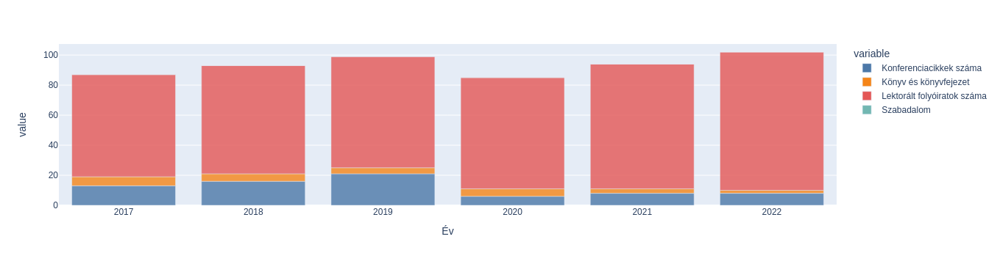

In [24]:
pubyearly = pubfaculty.reset_index()
pubyearly = pubyearly[pubyearly['Év'] > 2016]
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

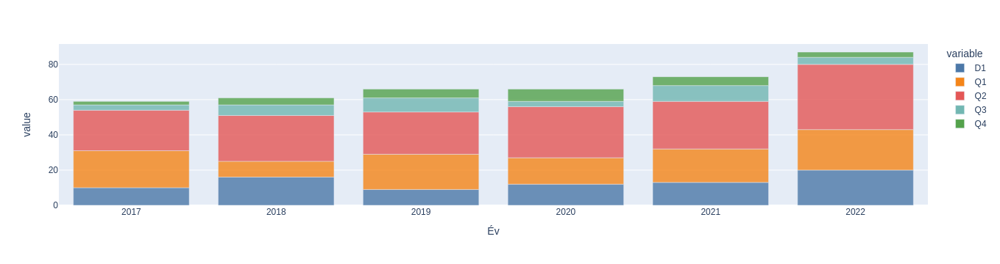

In [25]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

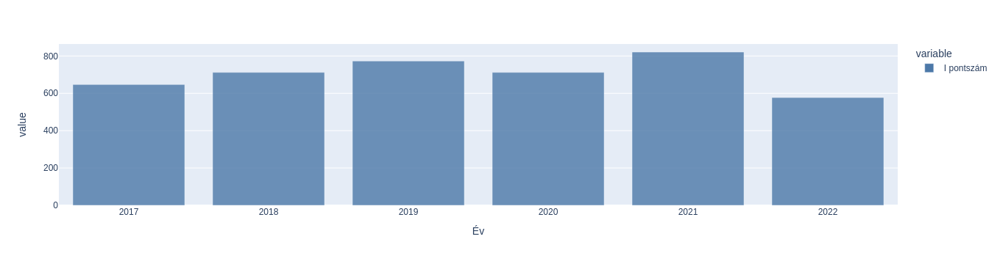

In [26]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

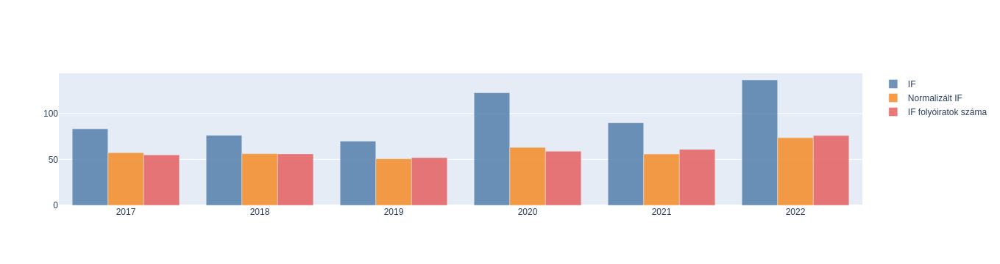

In [27]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

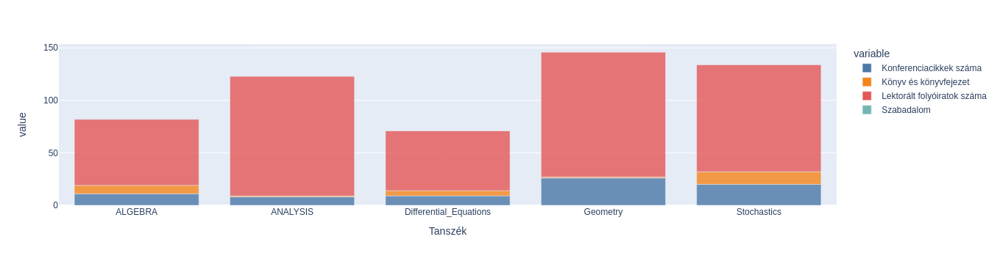

In [52]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()


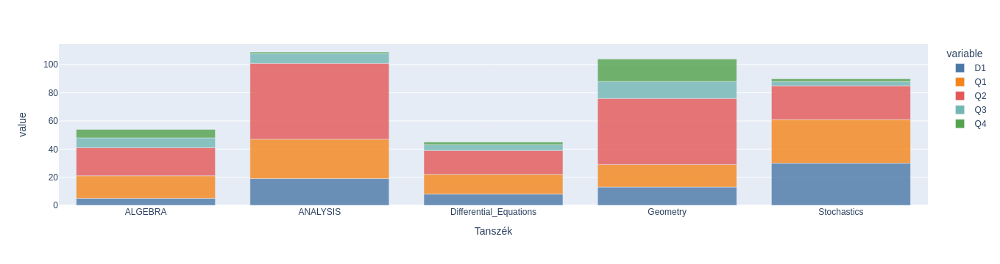

In [53]:

df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()


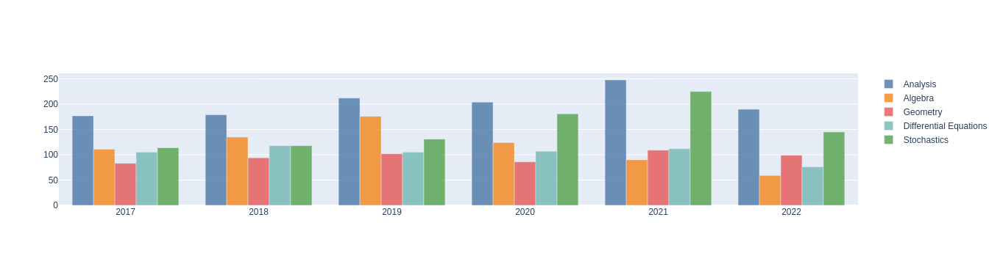

In [54]:

fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()


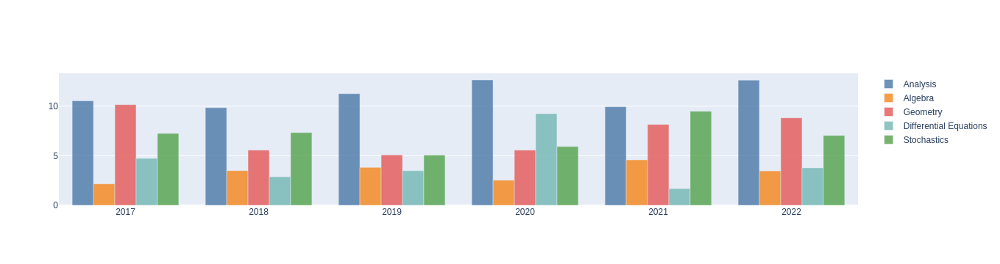

In [55]:

fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["Normalizált IF"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()

# departement regardless of resercher

In [56]:
for year in range(1990, 2023):
    page = 1
    while True:
        fName = f"./json_result/mtmtpubs-{year}-{page}.json"
        enYear = year
        stYear = 1900 if year <= 1990 else year
        os.system(f'wget -O {fName} "https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=institutes;inia;10856&cond=publishedYear;range;{stYear}%2C{enYear}&sort=publishedYear,desc&sort=firstAuthor,asc&page={page}&size=1000&fields=citations,pubStats&labelLang=hun&cite_type=2"')
        with open(fName, "r") as f:
            try:
                dta = json.load(f)
                if not dta["paging"]["last"]:
                    page += 1
                else:
                    break
            except:
                print("Error, retrying")
                pass


--2023-01-30 16:37:09--  https://m2.mtmt.hu/api/publication?cond=published;eq;true&cond=core;eq;true&cond=institutes;inia;10856&cond=publishedYear;range;1900%2C1990&sort=publishedYear,desc&sort=firstAuthor,asc&page=1&size=1000&fields=citations,pubStats&labelLang=hun&cite_type=2
Resolving m2.mtmt.hu (m2.mtmt.hu)... 193.224.44.74
Connecting to m2.mtmt.hu (m2.mtmt.hu)|193.224.44.74|:443... connected.
HTTP request sent, awaiting response... 200 
Length: unspecified [application/vnd.mtmt2-1.0+json]
Saving to: ‘./json_result/mtmtpubs-1990-1.json’

     0K .......... .......... .......... .......... .......... 83,8K
    50K .......... .......... .......... .......... ..........  138K
   100K .......... .......... .......... .......... ..........  196K
   150K .......... .......... .......... .......... ..........  207K
   200K .......... .......... .......... .......... ..........  265K
   250K .......... .......... .......... .......... ..........  202K
   300K .......... .......... ........

In [24]:
content = []
for fn in glob.glob("./json_result/mtmtpubs-*.json"):
    pubs = json.load(open(fn))
    content += pubs["content"]

In [25]:
ifdf = pd.read_csv('./pubgraph/ifdf_v8_2021.csv')
ifdf.loc[ifdf["if"].isnull(), "if"] = 0.0
maxIFYear = ifdf.year.max()
ifdf_e = ifdf.copy().set_index(["year", "eissn"]).sort_index()
ifdf_p = ifdf.copy().set_index(["year", "pissn"]).sort_index()

def getif(pub):
    if "journal" not in pub:
        return 0.0, 1.0
    year = min(pub["publishedYear"], maxIFYear)
    if "pIssn" in pub["journal"]:
        issn = pub["journal"]["pIssn"]
        if (year,issn) in ifdf_p.index:
            ifval = ifdf_p.loc[(year,issn),"if"]
            catif = ifdf_p.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    if "eIssn" in pub["journal"]:
        issn = pub["journal"]["eIssn"]
        if (year,issn) in ifdf_e.index:
            ifval = ifdf_e.loc[(year,issn),"if"]
            catif = ifdf_e.loc[(year,issn),"categoryMedianIf"]
            if len(ifval) == 1 and float(ifval) > 0.0:
                if len(catif) == 1 and float(catif) > 0.0:
                    return float(ifval), float(catif)
                else:
                    return float(ifval), float(ifval) # ha if-es az újság, de még nem elég régóta. nincs sok ilyen.
    return 0.0, 1.0

# a függvény visszaadja a folyóirat rangját (D1, Q1, Q2, ...)
def getrating(pub):
    if "ratings" not in pub:
        return ""
    for r in pub["ratings"]:
        if r["otype"] == "SjrRating" and "ranking" in r:
            return r["ranking"]
    return ""


In [26]:
for pub in content:
    pub["mtmt_title"] = ""
    if "error" in pub and pub["error"] != "VALIDATION_ERROR":
        pub["mtmt_cat"] = "skip - error"
    elif not pub["published"]:
        pub["mtmt_cat"] = "skip - nem published"
    elif "category" not in pub or pub["category"]["label"] != "Tudományos":
        pub["mtmt_cat"] = "skip - nem tudományos"        
    elif pub["otype"] == "JournalArticle" and "journal" in pub:
        if pub["fullPublication"] and "reviewType" in pub["journal"] and pub["journal"]["reviewType"] == "REVIEWED" and "subType" in pub and (pub["subType"]["name"] == "Szakcikk" or pub["subType"]["name"] == "Összefoglaló cikk" or pub["subType"]["name"] == "Konferenciaközlemény" or pub["subType"]["name"] == "Rövid közlemény" or pub["subType"]["name"] == "Sokszerzős vagy csoportos szerzőségű szakcikk"):
            pub["mtmt_cat"] = "journal"
        else:
            pub["mtmt_cat"] = "skip - nem lektorált folyóirat vagy nem értékelhető típus"
    elif pub["fullPublication"] and ((pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and pub["subType"]["label"] == "Konferenciaközlemény (Könyvrészlet)") or pub["type"]["label"] == "Egyéb konferenciaközlemény"):
        pub["mtmt_cat"] = "conference"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["book"]["title"]
    elif pub["type"]["label"] == "Könyv" or (pub["type"]["label"] == "Könyvrészlet" and "subType" in pub and (pub["subType"]["label"] == "Könyvfejezet (Könyvrészlet)" or pub["subType"]["label"] == "Szaktanulmány (Könyvrészlet)")):
        pub["mtmt_cat"] = "book"
        if "book" in pub and "title" in pub["book"]:
            pub["mtmt_title"] = pub["title"]
    elif pub["type"]["label"] == "Oltalmi formák":
        pub["mtmt_cat"] = "patent"
    elif not pub["fullPublication"]:
        pub["mtmt_cat"] = "skip - nem full publication"        
    elif pub["type"]["label"] == "Egyéb" or pub["type"]["label"] == "Disszertáció":
        pub["mtmt_cat"] = "skip - other"
    else:
        pub["mtmt_cat"] = "skip - uncategorized"
    
    # Oldalszám - a túl rövid publikációkat az MTA MTO nem veszi figyelembe
    plength = 0
    if 'pageLength' in pub:
        plength = pub["pageLength"]
    elif 'firstPage' in pub and 'lastPage' in pub and pub["lastPage"].isnumeric() and pub["firstPage"].isnumeric():
        plength = int(pub["lastPage"]) - int(pub["firstPage"]) + 1
    
    # Q pontszám kiszámolása a publikációra, az MTA MTO szabályai szerint
    pub["mtmt_q"] = 0    
    pub["mtmt_norm_q"] = 0    
    pub["mtmt_if"] = 0    
    pub["mtmt_norm_if"] = 0    
    nrm = 1.0
    if pub["mtmt_cat"] == "journal":
        ifct, nrm = getif(pub)        
        pub["mtmt_if"] = ifct
        pub["mtmt_norm_if"] = ifct / nrm
        if ifct > 0:
            pub["mtmt_q"] = max(0.6, ifct)
            pub["mtmt_norm_q"] = max(0.6, pub["mtmt_norm_if"])
        else:
            if pub["foreignEdition"]:
                pub["mtmt_q"] = 0.4
            else:
                pub["mtmt_q"] = 0.3
            pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "conference" and plength >= 4:
        if pub["foreignLanguage"]:
            pub["mtmt_q"] = 0.2
        else:
            pub["mtmt_q"] = 0.1
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    elif pub["mtmt_cat"] == "book" and plength >= 10:
        if plength >= 100:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 2
            else:
                pub["mtmt_q"] = 1
        else:
            if pub["foreignLanguage"]:
                pub["mtmt_q"] = 0.2 * np.floor(plength/10)
            else:
                pub["mtmt_q"] = 0.1 * np.floor(plength/10)            
        pub["mtmt_norm_q"] = pub["mtmt_q"]
    
    # I pontszám kiszámolása, összesen és évenként is
    pub["mtmt_i"] = pub["independentCitationCount"] # teljes eddigi I pontszám
    pub["mtmt_i_year"] = {}
    
    if "pubStats" in pub and "years" in pub["pubStats"]:
        for yr in pub["pubStats"]["years"]:
            pub["mtmt_i_year"][yr["year"]] = yr["independentCitationCount"]
    
    # Tanszék arányok a publikációban
    tszpart = {'ALGEBRA':0, 'ANALYSIS':0, 'Differential_Equations':0, 'Stochastics':0, 'Geometry':0} 
    authors = 0
    if "authorships" in pub:
        for auth in pub["authorships"]:
            if auth["authorTyped"]: # csak szerzőket veszünk figyelembe, szerkesztőket nem!
                authors += 1
                for tsz in tszmap:
                    if tsz in auth["label"]:
                        tszpart[tszmap[tsz]] += 1
                        break
    pub["mtmt_authors"] = authors  # a cikk szerzőinek száma
    if authors > 0:
        for v in tszpart:
            tszpart[v] /= authors
    pub["mtmt_tsz"] = tszpart # a cikkben részt vevő tanszékek aránya
    pub["mtmt_rating"] = getrating(pub)


In [27]:

pubyearly = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=map(list, zip(*itertools.product(tanszekek, range(2003, 2023)))))

dct = pubyearly.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        for tsz in tanszekek:
            if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023 and ("publicationPending" not in pub or not pub["publicationPending"]):
                if pub["mtmt_tsz"][tsz] > 0:
                    dct["Q pontszám"][(tsz,year)] += pub["mtmt_q"] * pub["mtmt_tsz"][tsz]
                    dct["Normalizált Q"][(tsz,year)] += pub["mtmt_norm_q"] * pub["mtmt_tsz"][tsz]
                    if pub["mtmt_if"] > 0:
                        dct["IF"][(tsz,year)] += pub["mtmt_if"] * pub["mtmt_tsz"][tsz]         
                        dct["Normalizált IF"][(tsz,year)] += pub["mtmt_norm_if"] * pub["mtmt_tsz"][tsz]         
                    if pub["mtmt_cat"] == "journal":
                        dct["Lektorált folyóiratok száma"][(tsz,year)] += 1                
                        if pub["mtmt_if"] > 0:
                            dct["IF folyóiratok száma"][(tsz,year)] += 1
                        rating = getrating(pub)
                        if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                            dct[rating][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "conference":
                        dct["Konferenciacikkek száma"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "book":
                        dct["Könyv és könyvfejezet"][(tsz,year)] += 1
                    if pub["mtmt_cat"] == "patent":
                        dct["Szabadalom"][(tsz,year)] += 1
                    dct["Publikációk száma"][(tsz,year)] += 1            
            if pub["mtmt_tsz"][tsz] > 0 and year in pub["mtmt_i_year"]:
                dct["I pontszám"][(tsz,year)] += pub["mtmt_i_year"][year]
                
pubyearly = pubyearly.from_dict(dct)
pubyearly.index.set_names(["Tanszék", "Év"], inplace=True)
pubyearly

Q pontszám  Normalizált Q  I pontszám         IF  \
Tanszék     Év                                                       
ALGEBRA     2003    3.757667       6.337917          32   2.175167   
            2004    3.233333       4.070302          47   1.286333   
            2005    3.682333       3.776351          45   1.881000   
            2006    2.934333       4.791631          72   2.174200   
            2007    1.793667       2.484732          44   1.267667   
...                      ...            ...         ...        ...   
Stochastics 2018   10.857750       9.373692         147  10.003750   
            2019    9.167167       8.152144         159   6.081167   
            2020   12.329167       7.135008         221  11.654167   
            2021   22.404917      14.313940         262  17.653250   
            2022   12.159097       7.939029         168  11.371319   

                  Normalizált IF  Publikációk száma  \
Tanszék     Év                                        
ALGEBRA     2003        5.437917                 18   
            2004        2.984532                 12   
            2005        2.393017                 15   
            2006        4.324965                  9   
            2007        2.134732                 11   
...                          ...                ...   
Stochastics 2018        8.510440                 27   
            2019        5.072144                 32   
            2020        6.439605                 20   
            2021        9.476379                 30   
            2022        7.051187                 22   

                  Lektorált folyóiratok száma  Konferenciacikkek száma  \
Tanszék     Év                                                           
ALGEBRA     2003                           13                        0   
            2004                            8                        0   
            2005                           10                        1   
            2006                            6                        2   
            2007                            5                        1   
...                                       ...                      ...   
Stochastics 2018                           18                        2   
            2019                           18                        9   
            2020                           14                        2   
            2021                           23                        2   
            2022                           19                        0   

                  Könyv és könyvfejezet  Szabadalom  IF folyóiratok száma  D1  \
Tanszék     Év                                                                  
ALGEBRA     2003                      2           1                     9   1   
            2004                      2           0                     5   1   
            2005                      1           0                     6   0   
            2006                      1           0                     6   2   
            2007                      0           0                     4   2   
...                                 ...         ...                   ...  ..   
Stochastics 2018                      3           0                    17  10   
            2019                      0           0                    10   3   
            2020                      1           0                    13   5   
            2021                      2           0                    15   6   
            2022                      2           0                    15   4   

                  Q1  Q2  Q3  Q4  
Tanszék     Év                    
ALGEBRA     2003   5   1   2   0  
            2004   0   3   1   0  
            2005   3   3   1   0  
            2006   1   3   0   0  
            2007   1   1   1   0  
...               ..  ..  ..  ..  
Stochastics 2018   2   5   0   0  
            2019   6   3   2   0  
            2020   4   4

In [28]:
pubfaculty = pd.DataFrame({"Q pontszám": 0.0, 
              "Normalizált Q": 0.0, 
              "I pontszám": 0, 
              "IF": 0.0, 
              "Normalizált IF": 0.0, 
              "Publikációk száma": 0, 
              "Lektorált folyóiratok száma": 0, 
              "Konferenciacikkek száma": 0, 
              "Könyv és könyvfejezet": 0, 
              "Szabadalom": 0, 
              "IF folyóiratok száma": 0, 
              "D1": 0, "Q1": 0, "Q2": 0, "Q3": 0, "Q4": 0
             }, index=list(range(2003,2023)))

dct = pubfaculty.to_dict() # csúnya hack, e nélkül a dataframe nagyon lassú lenne
for pub in content:
    for year in range(2003, 2023):
        if year == pub["publishedYear"] and pub["publishedYear"] >= 2003 and pub["publishedYear"] <= 2023:
            dct["Q pontszám"][year] += pub["mtmt_q"]
            dct["Normalizált Q"][year] += pub["mtmt_norm_q"]
            if pub["mtmt_if"] > 0:
                dct["IF"][year] += pub["mtmt_if"]
                dct["Normalizált IF"][year] += pub["mtmt_norm_if"]
            if pub["mtmt_cat"] == "journal":
                dct["Lektorált folyóiratok száma"][year] += 1                
                if pub["mtmt_if"] > 0:
                    dct["IF folyóiratok száma"][year] += 1
                rating = getrating(pub)
                if rating in ("D1", "Q1", "Q2", "Q3", "Q4"):
                    dct[rating][year] += 1
            if pub["mtmt_cat"] == "conference":
                dct["Konferenciacikkek száma"][year] += 1
            if pub["mtmt_cat"] == "book":
                dct["Könyv és könyvfejezet"][year] += 1
            if pub["mtmt_cat"] == "patent":
                dct["Szabadalom"][year] += 1
            dct["Publikációk száma"][year] += 1            
        if year in pub["mtmt_i_year"]:
            dct["I pontszám"][year] += pub["mtmt_i_year"][year]
                
pubfaculty = pubfaculty.from_dict(dct)
pubfaculty.index.set_names("Év", inplace=True)

pubfaculty

,Q pontszám,Normalizált Q,I pontszám,IF,Normalizált IF,Publikációk száma,Lektorált folyóiratok száma,Konferenciacikkek száma,Könyv és könyvfejezet,Szabadalom,IF folyóiratok száma,D1,Q1,Q2,Q3,Q4
Év,,,,,,,,,,,,,,,,
2003,40.839,52.872642,123,25.312,41.636451,100,62,16,4,1,37,4,12,14,18,0
2004,40.088,43.286094,193,26.513,31.984934,84,47,14,5,0,27,6,11,7,2,7
2005,39.588,43.868429,215,27.396,33.099207,75,41,10,2,0,23,9,9,5,2,5
2006,47.339,49.285963,296,31.258,35.450988,84,46,12,10,0,31,8,9,10,6,2
2007,49.447,45.097506,268,37.200,33.138480,98,53,15,4,0,36,7,12,15,6,4
2008,63.838,55.250349,314,46.433,37.308921,101,69,15,7,0,39,10,15,12,5,6
2009,54.217,50.558484,377,40.855,36.965825,92,59,9,5,0,37,10,9,13,8,8
2010,42.251,43.908154,411,25.329,26.744815,97,45,20,4,1,24,5,7,8,8,0
2011,76.782,75.105651,462,62.079,62.144815,136,82,13,1,0,56,16,16,16,13,2


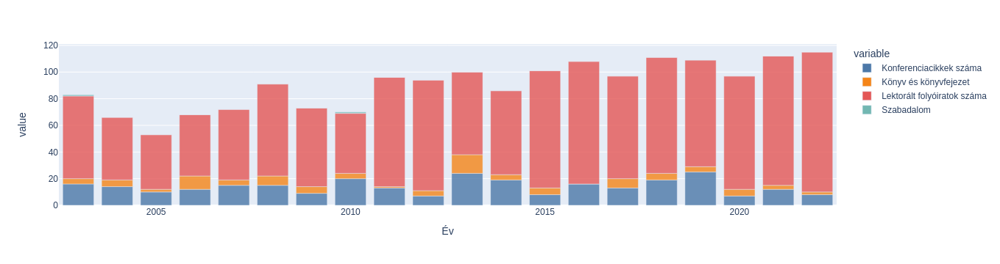

In [29]:
pubyearly = pubfaculty.reset_index()
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

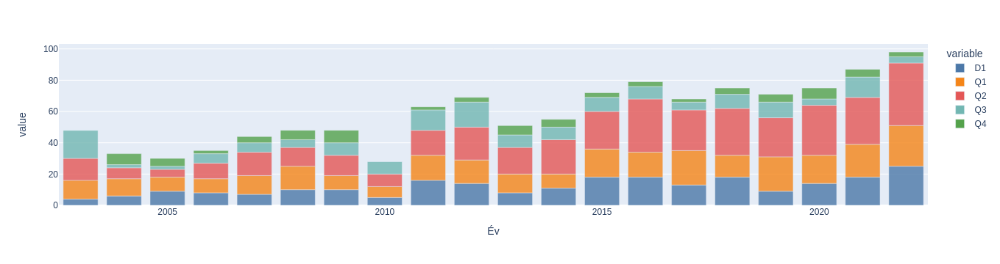

In [30]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

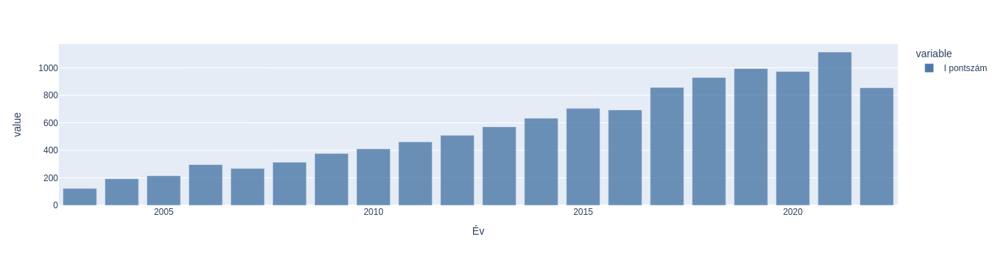

In [31]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

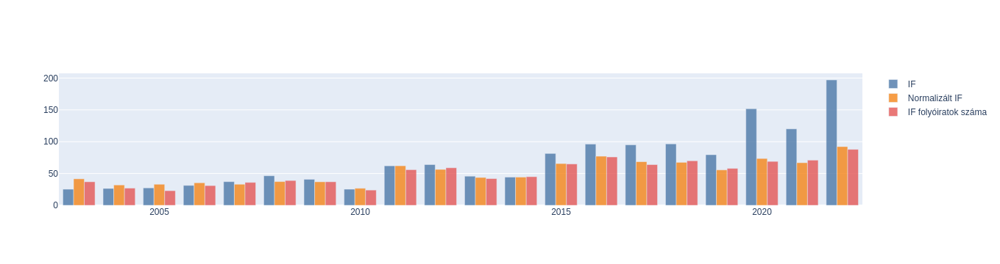

In [32]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

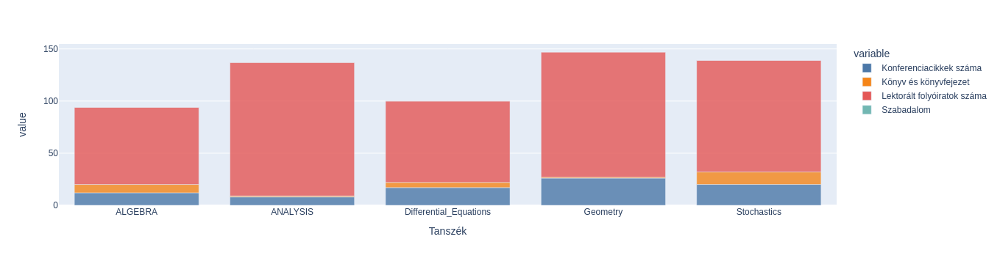

In [65]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()




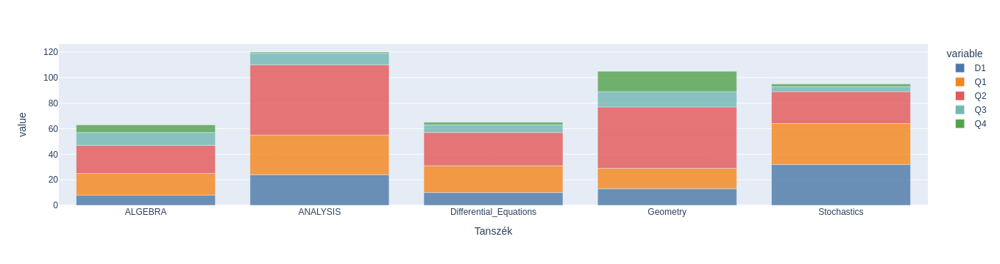

In [66]:
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

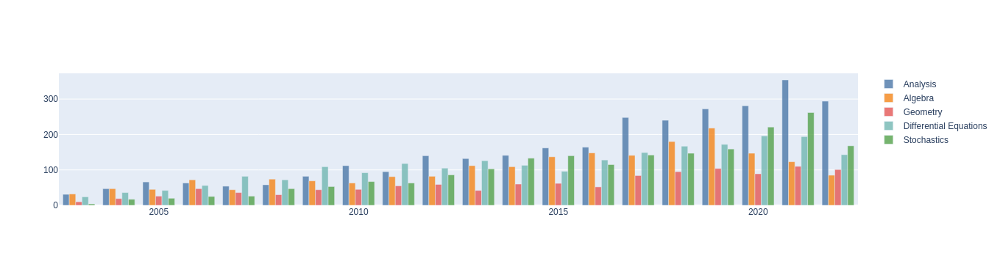

In [67]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()

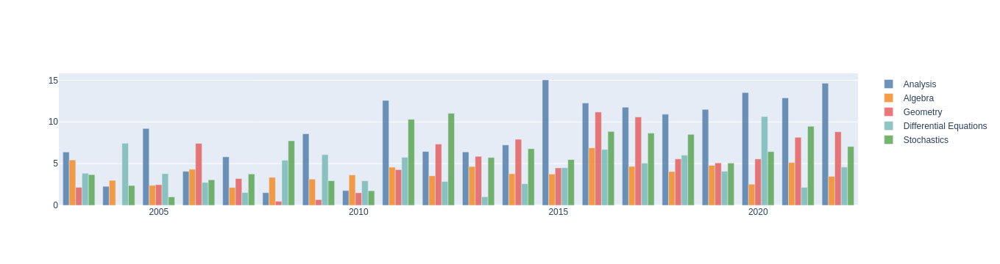

In [68]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["ccccccccccccccccccccccccc"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()

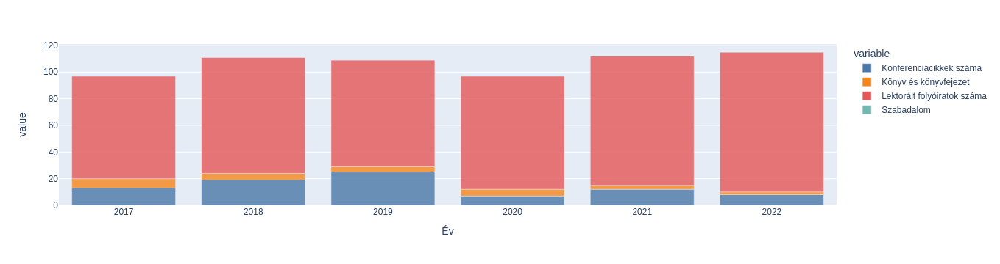

In [33]:
pubyearly = pubfaculty.reset_index()
pubyearly = pubyearly[pubyearly['Év'] > 2016]
fig = px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

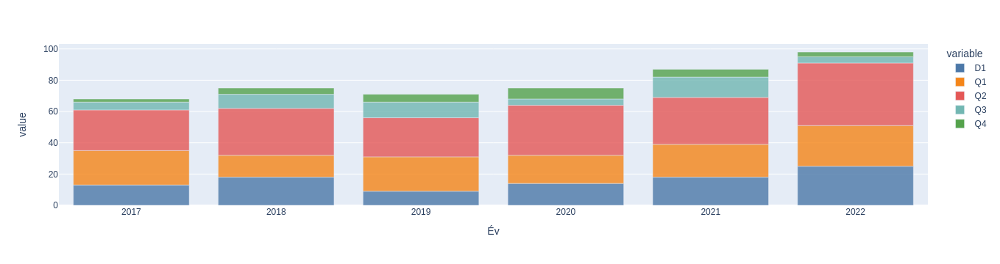

In [34]:

fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

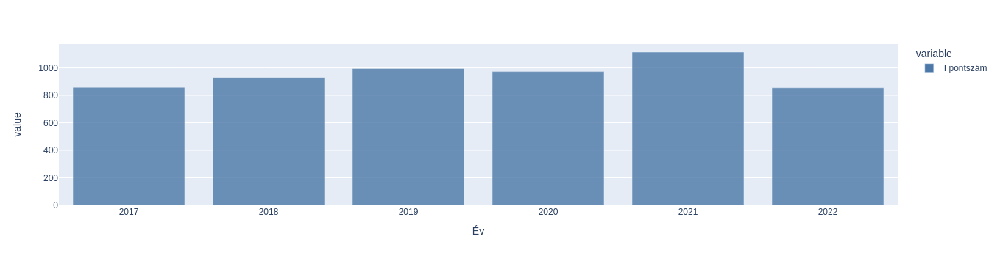

In [35]:
fig=px.bar(pubyearly,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Év", y=["I pontszám"])
fig.show()

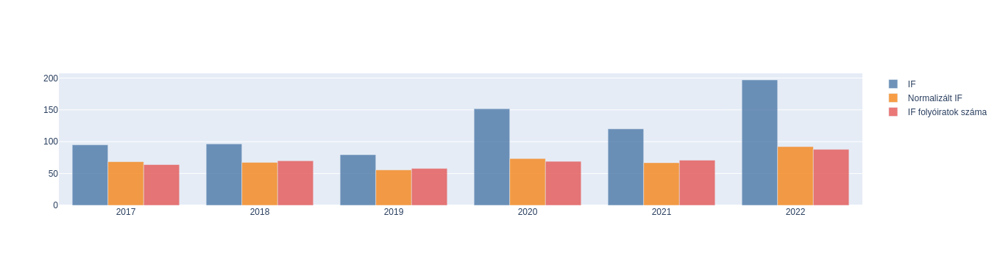

In [36]:
fig = go.Figure(data=[
    go.Bar(name='IF',opacity=0.8,marker_color='#4C78A8', x=pubyearly["Év"], y=pubyearly["IF"]),
    go.Bar(name='Normalizált IF',opacity=0.8,marker_color='#F58518', x=pubyearly["Év"], y=pubyearly["Normalizált IF"]),
    go.Bar(name='IF folyóiratok száma',opacity=0.8,marker_color='#E45756', x=pubyearly["Év"], y= pubyearly["IF folyóiratok száma"])
  ])
fig.update_layout(barmode='group')
fig.show()

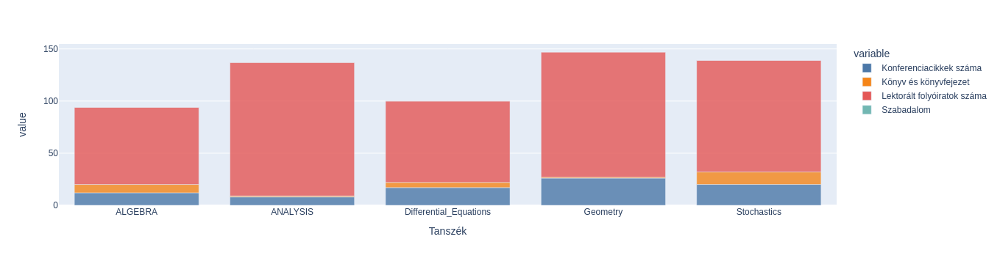

In [73]:
pubs=pubyearly
a=pubs[pubs['Tanszék'] == "ANALYSIS"]
b=pubs[pubs['Tanszék'] == "ALGEBRA"]
c=pubs[pubs['Tanszék'] == "Geometry"]
d=pubs[pubs['Tanszék'] == "Differential_Equations"]
e=pubs[pubs['Tanszék'] == "Stochastics"]
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["Konferenciacikkek száma", "Könyv és könyvfejezet", "Lektorált folyóiratok száma", "Szabadalom"])
fig.show()

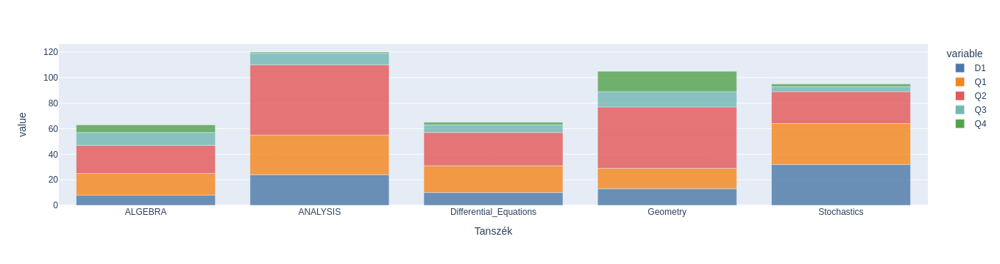

In [74]:
df = pubs
df = df[(df["Év"]>=2017) & (df["Év"]<=2023)]
df=df.groupby(['Tanszék']).sum()
df = df.reset_index()
fig = px.bar(df,opacity=0.8, color_discrete_sequence=px.colors.qualitative.T10, x="Tanszék", y=["D1", "Q1", "Q2", "Q3", "Q4"])
fig.show()

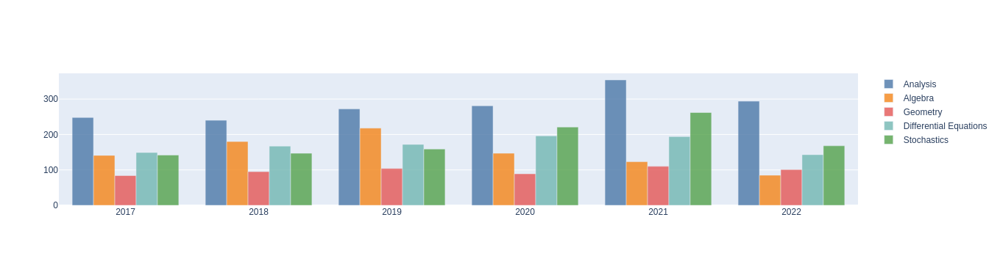

In [75]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["I pontszám"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["I pontszám"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["I pontszám"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["I pontszám"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["I pontszám"])
  ])
fig.show()

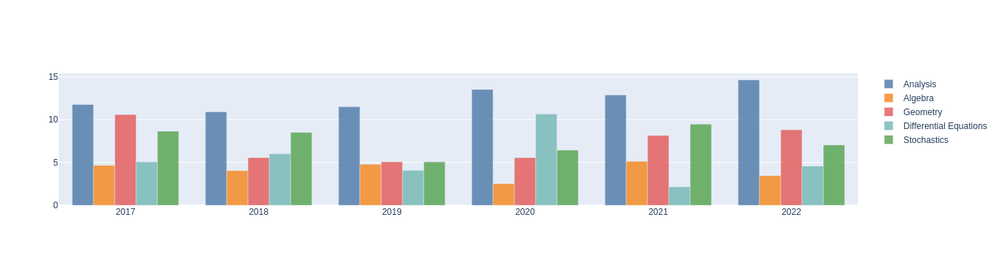

In [76]:
fig = go.Figure(data=[
    go.Bar(name='Analysis',opacity=0.8,marker_color='#4C78A8', x=pubs["Év"], y=a["Normalizált IF"]),
    go.Bar(name='Algebra',opacity=0.8,marker_color='#F58518', x=pubs["Év"], y=b["Normalizált IF"]),
    go.Bar(name='Geometry',opacity=0.8,marker_color='#E45756', x=pubs["Év"], y= c["Normalizált IF"]),
    go.Bar(name='Differential Equations',opacity=0.8,marker_color='#72B7B2', x=pubs["Év"], y= d["Normalizált IF"]),
    go.Bar(name='Stochastics',opacity=0.8,marker_color='#54A24B', x=pubs["Év"], y= e["Normalizált IF"])
  ])
fig.update_layout(barmode='group')
fig.show()